<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#A-Machine-Learning-Perspective-on-Regression" data-toc-modified-id="A-Machine-Learning-Perspective-on-Regression-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>A Machine-Learning Perspective on Regression</a></span></li><li><span><a href="#Non-Parametric-Models" data-toc-modified-id="Non-Parametric-Models-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Non-Parametric Models</a></span><ul class="toc-item"><li><span><a href="#Parametric-vs.-Non-Parametric-Models" data-toc-modified-id="Parametric-vs.-Non-Parametric-Models-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Parametric vs. Non-Parametric Models</a></span></li><li><span><a href="#Linear-Interpolation" data-toc-modified-id="Linear-Interpolation-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Linear Interpolation</a></span></li><li><span><a href="#Discussion:-What-is-in-the-column-space-of-the-matrix?-Why-do-we-set-fit_intercept=False?" data-toc-modified-id="Discussion:-What-is-in-the-column-space-of-the-matrix?-Why-do-we-set-fit_intercept=False?-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Discussion: What is in the column space of the matrix? Why do we set <code>fit_intercept=False</code>?</a></span></li><li><span><a href="#Exercise:-Use-every-third-data-point-of-the-spectra-dataset-to-train-a-linear-interpolation-model" data-toc-modified-id="Exercise:-Use-every-third-data-point-of-the-spectra-dataset-to-train-a-linear-interpolation-model-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Exercise: Use every third data point of the spectra dataset to train a linear interpolation model</a></span></li></ul></li><li><span><a href="#Kernel-Regression" data-toc-modified-id="Kernel-Regression-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel Regression</a></span><ul class="toc-item"><li><span><a href="#Exercise:-Evaluate-the-performance-of-the-rbf-kernel-as-a-function-of-kernel-width" data-toc-modified-id="Exercise:-Evaluate-the-performance-of-the-rbf-kernel-as-a-function-of-kernel-width-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Exercise: Evaluate the performance of the rbf kernel as a function of kernel width</a></span></li></ul></li></ul></div>

# Non-Parametric Models

## A Machine-Learning Perspective on Regression

The goal of regression is to find a function

$\vec{y} = f(\vec{x}) + \vec{\epsilon}$

where $f$ is the model, $x$ is the model input, $y$ is the model output, and $\epsilon$ is the error between the model in the data. The model inputs, $\vec{x}$ are often called the **features** of a data point. In the previous example we created features using transformations of $x$ like polynomials and Gaussian functions. Sometimes, features may also be given in the dataset (e.g. multiple inputs correspond to a single output). Other times, the model input may be data that does not have obvious vector-based features (e.g. images, audio, molecules, etc.). In this case, we can think of the features as "fingerprints" of some more complex raw input data.

Of course representing the model as $f$ is a gross oversimplification. The function must have some form, and it usually requires **parameters**. Previously we considered general linear regression models of the form:

$y_i = \sum_j w_j X_{ij} + \epsilon_i$

where the **parameters** are given by $\vec{w}$. We also considered non-linear regression with Gaussian functions, which required more parameters, $\vec{w}$, $\vec{\mu}$, and $\vec{\sigma}$. We saw that in order to optimize these parameters we had to put them into a single vector. We could consider this to be a parameter vector, $\vec{\lambda} = [\vec{w}, \vec{\mu}, \vec{\sigma}]$, and re-write the model more generally as:

$\vec{y} = f(\vec{x}, \vec{\lambda}) + \vec{\epsilon}$

We also had to decide on how many parameters to include. In the case of polynomial regression this corresponded to the order of the highest polynomial, while for Gaussian regression it corresponded to the number of Gaussian functions to include. This number of parameters to include is called a **hyperparameter**. Hyperparameters control the complexity of the final model, and the parameters will depend on the hyperparameters, so we can think of the parameters as being a function of the hyperparameters, $\vec{\lambda}(\vec{\eta})$. If we put all this together we get a model form of:

$\vec{y} = f(\vec{x}, \vec{\lambda}(\vec{\eta})) + \vec{\epsilon}$

Machine learning differs from regular regression in that it seeks to optimize $\vec{\lambda}$ (parameter optimization), $\vec{\eta}$ (complexity optimization) in order to **obtain a model that generalizes to new input data**. Machine learning also sometimes involves selecting $\vec{x}$ (feature selection) or generating $\vec{x}$ from non-vectorized data such as text or images (feature generation).

## Non-Parametric Models

We covered the basic math behind parameter optimization in the numerical methods module. The basic idea is to follow two steps:

* Construct a loss function that quantifies how well your model fits the data
* Minimize the loss function with respect to the model parameters

The loss function itself could be the sum of squared errors, some other measure of error (e.g. absolute value of error), and can also contain constraints on the parameters themselves (e.g. force parameters to be positive).

Minimizing the loss function can be achieved analytically in the case of general linear models, or numerically for non-linear models. Moving forward we will typically default to numerical optimization.

In this section we will explore another aspect of model parameters by looking at a new class of models called "non-parameteric" models. The math of parameter optimization is the same, but the way the parameters are defined is different.

### Parametric vs. Non-Parametric Models

A "parametric" model has parameters that do not explicitly depend on or include the input points. The polynomial regression model is an example of a parametric model. The number of parameters is fixed with respect to the number of data points.

A "non-parametric" model includes parameters that are defined on the domain of the independent variables and depend on the inputs. A spline model is an example of a non-parametric model. The number of parameters in the model varies with the number of data points.

Nonparametric models are generally excellent for interpolation, but fail miserably for extrapolation, while parametric models are less accurate for interpolation but provide more reasonable extrapolations. Nonparametric models tend to have many more parameters, and proper optimization of model complexity can lead to similar performance for both types.

See [this post](https://machinelearningmastery.com/parametric-and-nonparametric-machine-learning-algorithms/) for more information.

### Linear Interpolation

Let's revisit the spectra dataset that we worked with during the last module:

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

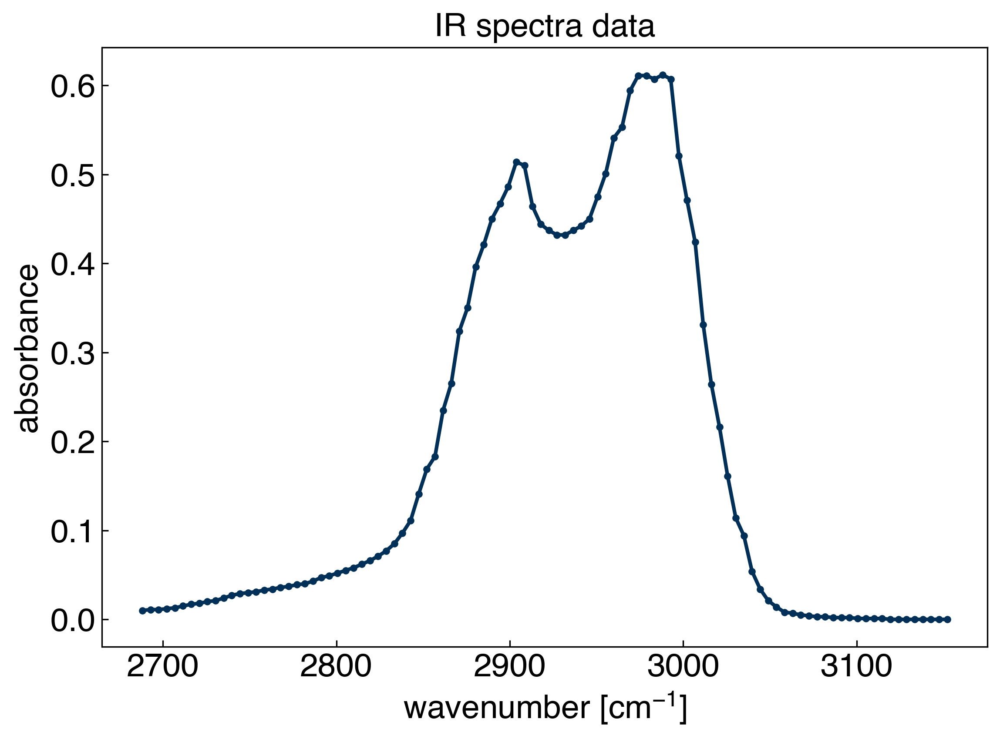

In [2]:
import numpy as np
import pandas as pd

df = pd.read_csv('data/ethanol_IR.csv')
x_all = df['wavenumber [cm^-1]'].values
y_all = df['absorbance'].values

x_peak = x_all[475:575]
y_peak = y_all[475:575]

fig, ax = plt.subplots()
ax.plot(x_peak,y_peak, '-', marker='.')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data');

Let's consider the common problem that we want to interpolate between points with a straight line. It turns out we can solve this by using a general linear model!

The key is to use a basis of "piecewise linear" functions:

$X_{ij} = max(0, x_i-x_j)$

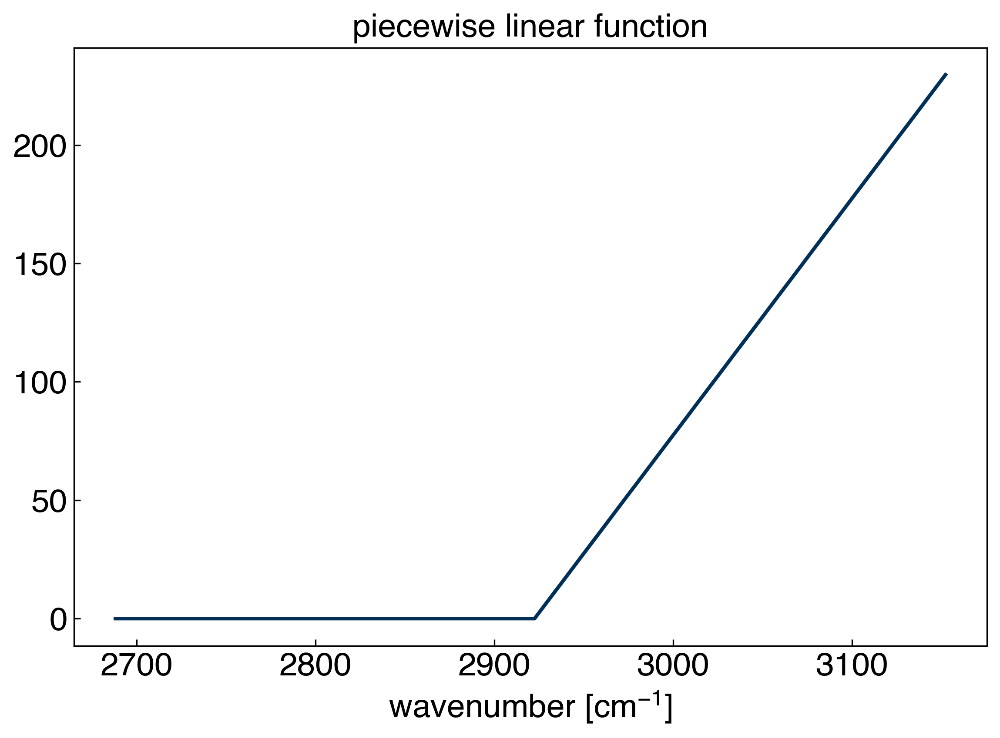

In [3]:
def piecewise_linear(x):
    N = len(x)
    X = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            X[i,j] = max(0, x[i] - x[j])
    return X
            
X = piecewise_linear(x_peak)

fig, ax = plt.subplots()
ax.plot(x_peak, X[:,50], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_title('piecewise linear function');

There is one technical detail here, since the final column will actually just be 0:

In [4]:
X[:,-1]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

Clearly, this cannot contribute to the model. We can make it a column of 1's instead, so that it acts like an intercept term:

In [5]:
X[:,-1] += 1
X[:, -1]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

Now let's take a look at all of the basis functions:

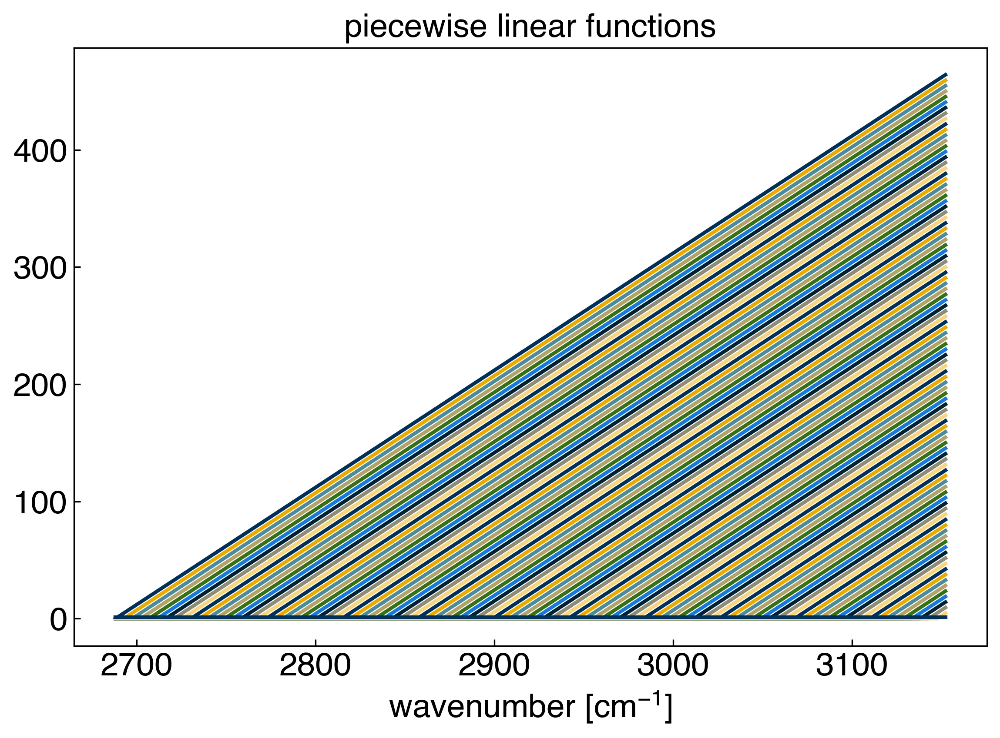

In [6]:
fig, ax = plt.subplots()
for i in range(len(x_peak)):
    ax.plot(x_peak, X[:,i], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_title('piecewise linear functions');

Our basis set, or "features" consist straight lines with slope 1 that originate at each data point. Now we can achieve linear interpolation by solving the general linear regression problem. We will use `scikit-learn` to make this easy, but you can verify the solution using the equations from the foundations module if you want:

r^2 = 1.0


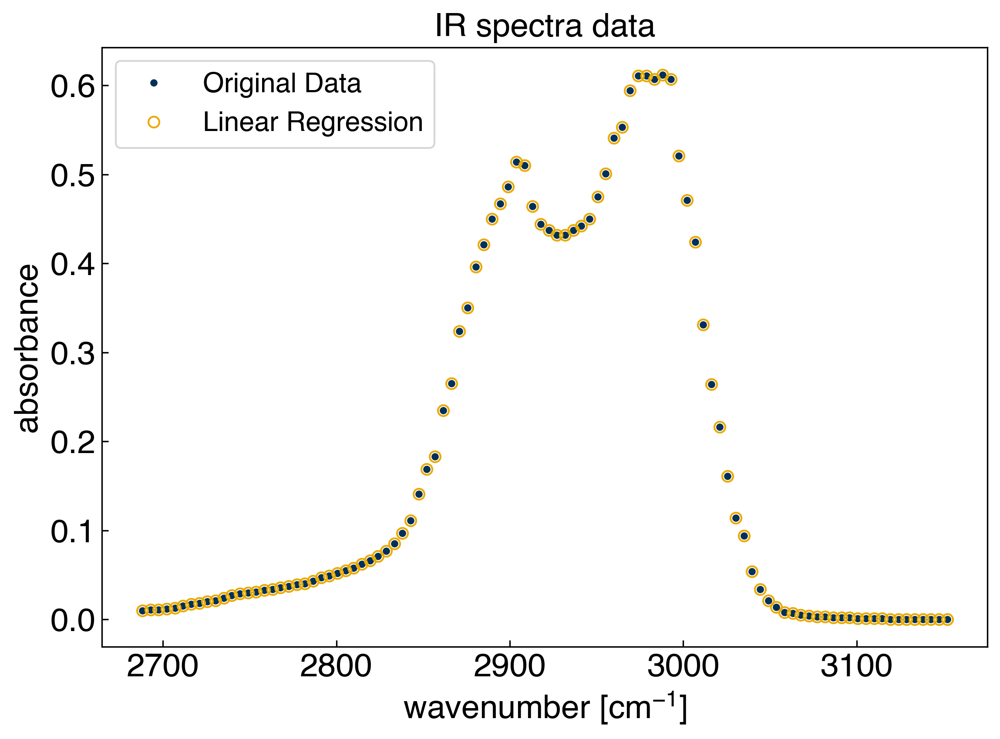

In [7]:
from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=False) #create a linear regression model instance (no intercept needed)
model.fit(X, y_peak) #fit the model
r2 = model.score(X, y_peak) #get the "score", which is equivalent to r^2

yhat = model.predict(X) #create the model prediction

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, '.')
ax.plot(x_peak, yhat, 'o', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data')
ax.legend(['Original Data', 'Linear Regression'])
print('r^2 = {}'.format(r2))

We can see that the model goes through every point exactly, which we should know from $r^2=1$. However, we don't actually know what the model is doing in between the points. For this we need to predict on a new set of $x$ points that has a higher resolution:

### Discussion: What is in the column space of the matrix? Why do we set `fit_intercept=False`?

> The original data lies in the column space of the matrix.  
`fit_intercept = False` adds a column of 1's at the end of the matrix, which we already have done this previously.  
Therefore, there is no need to do the same thing twice.

In [8]:
x_predict = np.linspace(2650, 3150, 1000)
X_predict = piecewise_linear(x_predict)

We see that we cannot predict on the new dataset because the dimensions of the matrices do not match. The column space acts as a basis set for regression, and when we trained the model we had 100 "features" (one for each data point). However, our new X matrix has 500 columns, which is a different set of features than the 100 that we trained on originally. If we want to make predictions we need to expand the **row** space while keeping the column space constant.

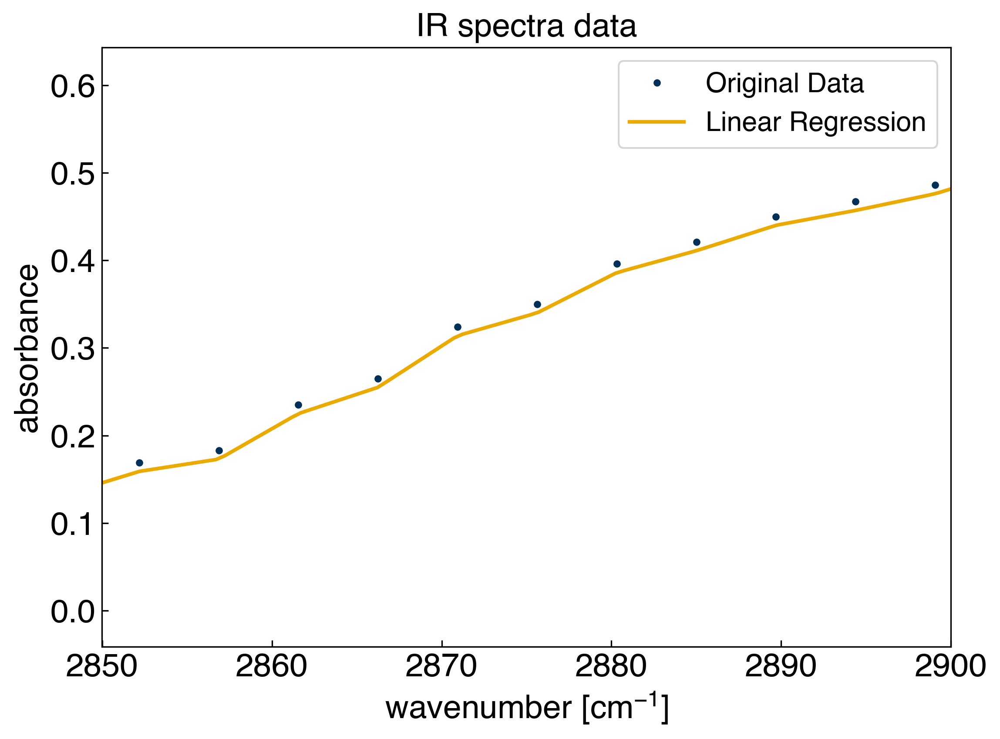

r^2 = 1.0


In [9]:
def piecewise_linear(x_train, x_test=None):
    if x_test is None:
        x_test = x_train
    N = len(x_test) #<- number of data points
    M = len(x_train) #<- number of features
    X = np.zeros((N,M))
    for i in range(N):
        for j in range(M):
            X[i,j] = max(0, x_test[i] - x_train[j])
    return X

X_predict = piecewise_linear(x_peak, x_predict)
yhat_predict = model.predict(X_predict)

r2 = model.score(X, y_peak)

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, '.')
ax.plot(x_predict, yhat_predict, '-', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data')
ax.legend(['Original Data', 'Linear Regression'])
ax.set_xlim([2850, 2900])
plt.show()
print('r^2 = {}'.format(r2))

We see that the model successful at interpolating between the points. This is an example of a **non-parametric** model. The number of parameters, $\vec{w}$ is equal to the number of data points.

### Exercise: Use every third data point of the spectra dataset to train a linear interpolation model

First, select every third datapoint from the `(x_peak, y_peak)` dataset, and use this to train a linear interpolation model. Then, predict the full dataset using the model.

![image_info](./images/interpolation.png)

## Kernel Regression

We are not limited to using piecewise linear functions. We can actually generalize this using the idea of a "kernel":

$K(i, j) = f(x_i, x_j)$

where $f$ can be any function. The most commonly used kernel is the "radial basis function", or `rbf` kernel:

$rbf(i, j) = exp(-\gamma (x_i - x_j)^2)$

If you look closely, you will see that this is the same as a Gaussian function, where $\mu = x_j$ and $\gamma = \frac{1}{2\sigma^2}$:

$G(x_i) = exp\left(\frac{-(x_i - \mu)^2}{2\sigma^2}\right)$

Let's follow the same procedure as before, but now we will use a "radial basis function":

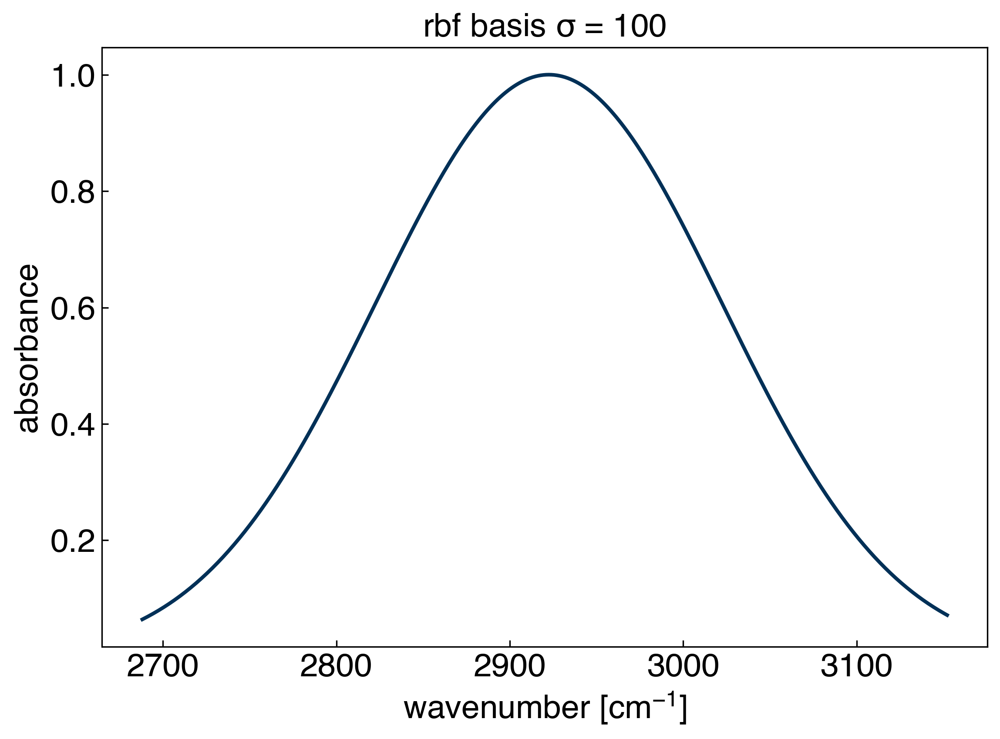

In [10]:
def rbf(x_train, x_test=None, gamma=1):
    if x_test is None:
        x_test = x_train
    N = len(x_test) #<- number of data points
    M = len(x_train) #<- number of features
    X = np.zeros((N,M))
    for i in range(N):
        for j in range(M):
            X[i,j] = np.exp(-gamma*(x_test[i] - x_train[j])**2)
    return X

sigma = 100
gamma = 1./(2*sigma**2)
x_test = np.linspace(min(x_peak), max(x_peak), 300)
X_rbf = rbf(x_peak, x_test=x_test, gamma=gamma)

fig, ax = plt.subplots()
ax.plot(x_test, X_rbf[:,50], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('rbf basis $\sigma$ = {}'.format(str(sigma)));

Essentially, we are now putting a Gaussian basis set with a fixed width at every training point! Let's see how it performs:

r^2 = 0.9987634078177691


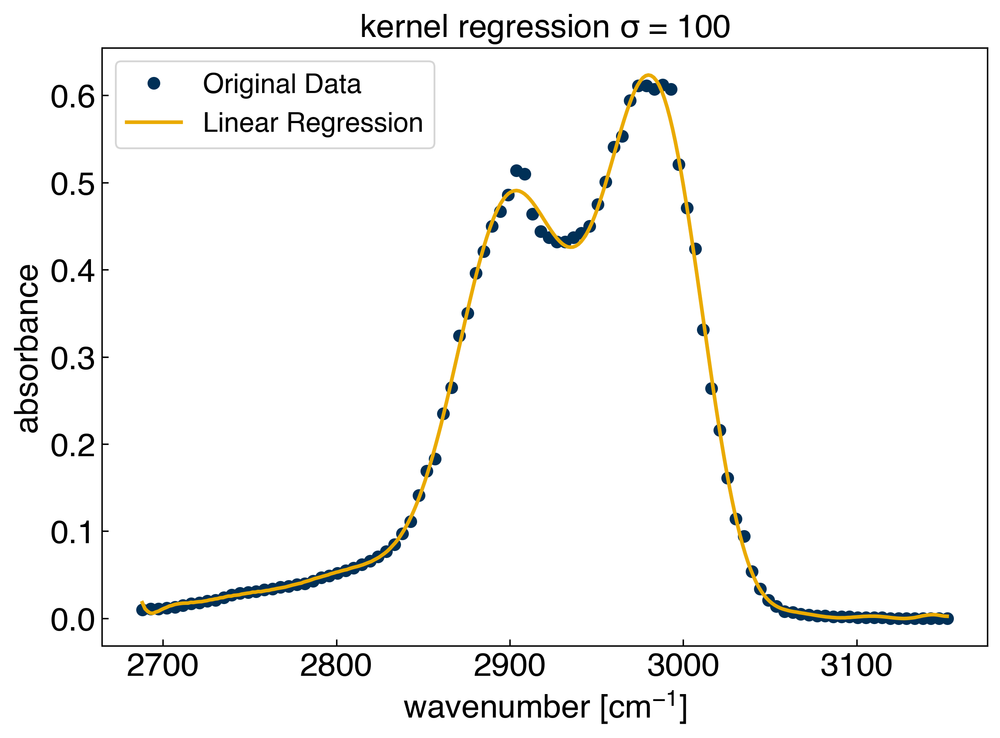

In [11]:
X_train = rbf(x_peak, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_peak) #fit the model
r2 = model_rbf.score(X_train, y_peak) #get the "score", which is equivalent to r^2
print('r^2 = {}'.format(r2))

X_test = rbf(x_peak, x_test=x_test, gamma=gamma)

yhat_rbf = model_rbf.predict(X_test) #create the model prediction

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o')
ax.plot(x_test, yhat_rbf, '-', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('kernel regression $\sigma$ = {}'.format(str(sigma)))
ax.legend(['Original Data', 'Linear Regression']);

In [12]:
yhat_rbf.shape
x_peak.shape

(100,)

### Exercise: Evaluate the performance of the rbf kernel as a function of kernel width

Use the same strategy as the previous exercise to select every third point in the spectra to use as the training set. Then, vary the width of the radial basis function with $\sigma = [1, 10, 100]$, and compute the $r^2$ score for each *using the entire dataset*.

Plot $r^2$ as a function of $\sigma$.

![image_info](./images/r2_vs_kernelwidth.png)

Let's also see how the performance of the model changes as we use fewer initial training points:

r^2 training = 1.0
r^2 testing = 0.9984890582179191


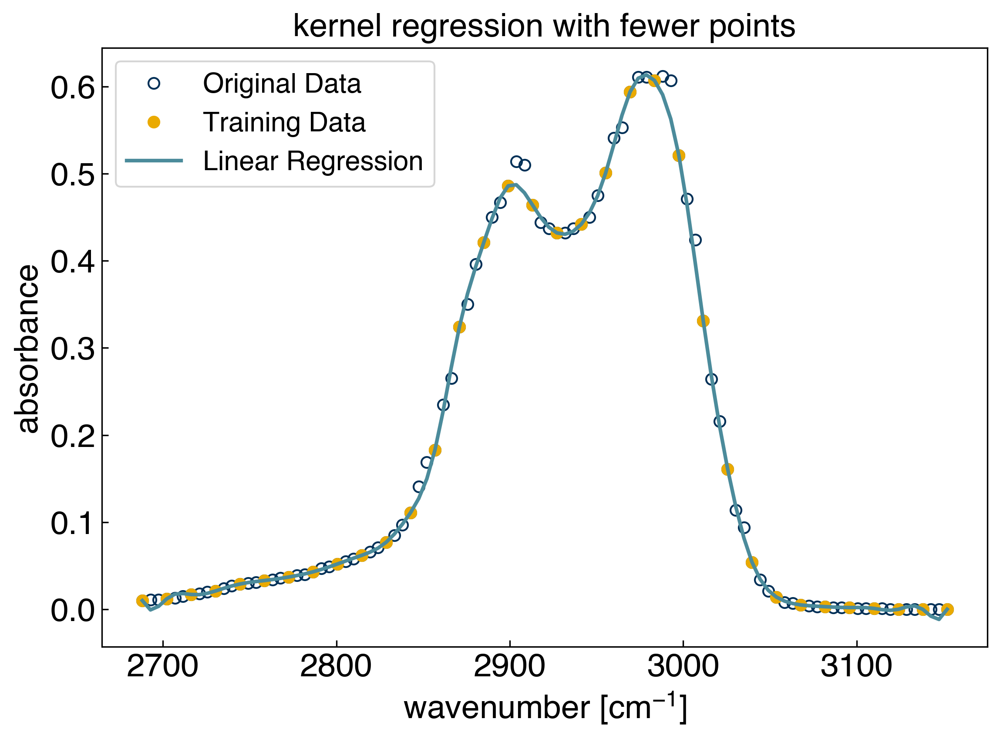

In [13]:
spacing = 3
sigma = 10
gamma = 1./(2*sigma**2)

x_train = x_peak[::spacing]
y_train = y_peak[::spacing]

X_train = rbf(x_train, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_train) #fit the model
r2 = model_rbf.score(X_train, y_train) #get the "score", which is equivalent to r^2
print('r^2 training = {}'.format(r2))

X_all = rbf(x_train, x_test=x_peak, gamma=gamma)

yhat_rbf = model_rbf.predict(X_all) #create the model prediction

r2 = model_rbf.score(X_all, y_peak) #get the "score", which is equivalent to r^2
print('r^2 testing = {}'.format(r2))

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o', markerfacecolor='none')
ax.plot(x_train, y_train, 'o')
ax.plot(x_peak, yhat_rbf, '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('kernel regression with fewer points')
ax.legend(['Original Data', 'Training Data', 'Linear Regression'])
plt.show()

We see that training the model on part of the dataset, and "testing" it on the data it did not see provides a route to determining which values of sigma/gamma yield good results. We will continue exploring this idea in the following lecture.

In [ ]:
<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#A-Machine-Learning-Perspective-on-Regression" data-toc-modified-id="A-Machine-Learning-Perspective-on-Regression-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>A Machine-Learning Perspective on Regression</a></span></li><li><span><a href="#Non-Parametric-Models" data-toc-modified-id="Non-Parametric-Models-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Non-Parametric Models</a></span><ul class="toc-item"><li><span><a href="#Parametric-vs.-Non-Parametric-Models" data-toc-modified-id="Parametric-vs.-Non-Parametric-Models-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Parametric vs. Non-Parametric Models</a></span></li><li><span><a href="#Linear-Interpolation" data-toc-modified-id="Linear-Interpolation-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Linear Interpolation</a></span></li><li><span><a href="#Discussion:-What-is-in-the-column-space-of-the-matrix?-Why-do-we-set-fit_intercept=False?" data-toc-modified-id="Discussion:-What-is-in-the-column-space-of-the-matrix?-Why-do-we-set-fit_intercept=False?-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Discussion: What is in the column space of the matrix? Why do we set <code>fit_intercept=False</code>?</a></span></li><li><span><a href="#Exercise:-Use-every-third-data-point-of-the-spectra-dataset-to-train-a-linear-interpolation-model" data-toc-modified-id="Exercise:-Use-every-third-data-point-of-the-spectra-dataset-to-train-a-linear-interpolation-model-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Exercise: Use every third data point of the spectra dataset to train a linear interpolation model</a></span></li></ul></li><li><span><a href="#Kernel-Regression" data-toc-modified-id="Kernel-Regression-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel Regression</a></span><ul class="toc-item"><li><span><a href="#Exercise:-Evaluate-the-performance-of-the-rbf-kernel-as-a-function-of-kernel-width" data-toc-modified-id="Exercise:-Evaluate-the-performance-of-the-rbf-kernel-as-a-function-of-kernel-width-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Exercise: Evaluate the performance of the rbf kernel as a function of kernel width</a></span></li></ul></li></ul></div>

# Non-Parametric Models

## A Machine-Learning Perspective on Regression

The goal of regression is to find a function

$\vec{y} = f(\vec{x}) + \vec{\epsilon}$

where $f$ is the model, $x$ is the model input, $y$ is the model output, and $\epsilon$ is the error between the model in the data. The model inputs, $\vec{x}$ are often called the **features** of a data point. In the previous example we created features using transformations of $x$ like polynomials and Gaussian functions. Sometimes, features may also be given in the dataset (e.g. multiple inputs correspond to a single output). Other times, the model input may be data that does not have obvious vector-based features (e.g. images, audio, molecules, etc.). In this case, we can think of the features as "fingerprints" of some more complex raw input data.

Of course representing the model as $f$ is a gross oversimplification. The function must have some form, and it usually requires **parameters**. Previously we considered general linear regression models of the form:

$y_i = \sum_j w_j X_{ij} + \epsilon_i$

where the **parameters** are given by $\vec{w}$. We also considered non-linear regression with Gaussian functions, which required more parameters, $\vec{w}$, $\vec{\mu}$, and $\vec{\sigma}$. We saw that in order to optimize these parameters we had to put them into a single vector. We could consider this to be a parameter vector, $\vec{\lambda} = [\vec{w}, \vec{\mu}, \vec{\sigma}]$, and re-write the model more generally as:

$\vec{y} = f(\vec{x}, \vec{\lambda}) + \vec{\epsilon}$

We also had to decide on how many parameters to include. In the case of polynomial regression this corresponded to the order of the highest polynomial, while for Gaussian regression it corresponded to the number of Gaussian functions to include. This number of parameters to include is called a **hyperparameter**. Hyperparameters control the complexity of the final model, and the parameters will depend on the hyperparameters, so we can think of the parameters as being a function of the hyperparameters, $\vec{\lambda}(\vec{\eta})$. If we put all this together we get a model form of:

$\vec{y} = f(\vec{x}, \vec{\lambda}(\vec{\eta})) + \vec{\epsilon}$

Machine learning differs from regular regression in that it seeks to optimize $\vec{\lambda}$ (parameter optimization), $\vec{\eta}$ (complexity optimization) in order to **obtain a model that generalizes to new input data**. Machine learning also sometimes involves selecting $\vec{x}$ (feature selection) or generating $\vec{x}$ from non-vectorized data such as text or images (feature generation).

## Non-Parametric Models

We covered the basic math behind parameter optimization in the numerical methods module. The basic idea is to follow two steps:

* Construct a loss function that quantifies how well your model fits the data
* Minimize the loss function with respect to the model parameters

The loss function itself could be the sum of squared errors, some other measure of error (e.g. absolute value of error), and can also contain constraints on the parameters themselves (e.g. force parameters to be positive).

Minimizing the loss function can be achieved analytically in the case of general linear models, or numerically for non-linear models. Moving forward we will typically default to numerical optimization.

In this section we will explore another aspect of model parameters by looking at a new class of models called "non-parameteric" models. The math of parameter optimization is the same, but the way the parameters are defined is different.

### Parametric vs. Non-Parametric Models

A "parametric" model has parameters that do not explicitly depend on or include the input points. The polynomial regression model is an example of a parametric model. The number of parameters is fixed with respect to the number of data points.

A "non-parametric" model includes parameters that are defined on the domain of the independent variables and depend on the inputs. A spline model is an example of a non-parametric model. The number of parameters in the model varies with the number of data points.

Nonparametric models are generally excellent for interpolation, but fail miserably for extrapolation, while parametric models are less accurate for interpolation but provide more reasonable extrapolations. Nonparametric models tend to have many more parameters, and proper optimization of model complexity can lead to similar performance for both types.

See [this post](https://machinelearningmastery.com/parametric-and-nonparametric-machine-learning-algorithms/) for more information.

### Linear Interpolation

Let's revisit the spectra dataset that we worked with during the last module:

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

import numpy as np
import pandas as pd

df = pd.read_csv('data/ethanol_IR.csv')
x_all = df['wavenumber [cm^-1]'].values
y_all = df['absorbance'].values

x_peak = x_all[475:575]
y_peak = y_all[475:575]

fig, ax = plt.subplots()
ax.plot(x_peak,y_peak, '-', marker='.')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data');

Let's consider the common problem that we want to interpolate between points with a straight line. It turns out we can solve this by using a general linear model!

The key is to use a basis of "piecewise linear" functions:

$X_{ij} = max(0, x_i-x_j)$

def piecewise_linear(x):
    N = len(x)
    X = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            X[i,j] = max(0, x[i] - x[j])
    return X
            
X = piecewise_linear(x_peak)

fig, ax = plt.subplots()
ax.plot(x_peak, X[:,50], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_title('piecewise linear function');

There is one technical detail here, since the final column will actually just be 0:

X[:,-1]

Clearly, this cannot contribute to the model. We can make it a column of 1's instead, so that it acts like an intercept term:

X[:,-1] += 1
X[:, -1]

Now let's take a look at all of the basis functions:

fig, ax = plt.subplots()
for i in range(len(x_peak)):
    ax.plot(x_peak, X[:,i], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_title('piecewise linear functions');

Our basis set, or "features" consist straight lines with slope 1 that originate at each data point. Now we can achieve linear interpolation by solving the general linear regression problem. We will use `scikit-learn` to make this easy, but you can verify the solution using the equations from the foundations module if you want:

from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=False) #create a linear regression model instance (no intercept needed)
model.fit(X, y_peak) #fit the model
r2 = model.score(X, y_peak) #get the "score", which is equivalent to r^2

yhat = model.predict(X) #create the model prediction

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, '.')
ax.plot(x_peak, yhat, 'o', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data')
ax.legend(['Original Data', 'Linear Regression'])
print('r^2 = {}'.format(r2))

We can see that the model goes through every point exactly, which we should know from $r^2=1$. However, we don't actually know what the model is doing in between the points. For this we need to predict on a new set of $x$ points that has a higher resolution:

### Discussion: What is in the column space of the matrix? Why do we set `fit_intercept=False`?

> The original data lies in the column space of the matrix.  
`fit_intercept = False` adds a column of 1's at the end of the matrix, which we already have done this previously.  
Therefore, there is no need to do the same thing twice.

x_predict = np.linspace(2650, 3150, 1000)
X_predict = piecewise_linear(x_predict)

We see that we cannot predict on the new dataset because the dimensions of the matrices do not match. The column space acts as a basis set for regression, and when we trained the model we had 100 "features" (one for each data point). However, our new X matrix has 500 columns, which is a different set of features than the 100 that we trained on originally. If we want to make predictions we need to expand the **row** space while keeping the column space constant.

def piecewise_linear(x_train, x_test=None):
    if x_test is None:
        x_test = x_train
    N = len(x_test) #<- number of data points
    M = len(x_train) #<- number of features
    X = np.zeros((N,M))
    for i in range(N):
        for j in range(M):
            X[i,j] = max(0, x_test[i] - x_train[j])
    return X

X_predict = piecewise_linear(x_peak, x_predict)
yhat_predict = model.predict(X_predict)

r2 = model.score(X, y_peak)

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, '.')
ax.plot(x_predict, yhat_predict, '-', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('IR spectra data')
ax.legend(['Original Data', 'Linear Regression'])
ax.set_xlim([2850, 2900])
plt.show()
print('r^2 = {}'.format(r2))

We see that the model successful at interpolating between the points. This is an example of a **non-parametric** model. The number of parameters, $\vec{w}$ is equal to the number of data points.

### Exercise: Use every third data point of the spectra dataset to train a linear interpolation model

First, select every third datapoint from the `(x_peak, y_peak)` dataset, and use this to train a linear interpolation model. Then, predict the full dataset using the model.

![image_info](./images/interpolation.png)

## Kernel Regression

We are not limited to using piecewise linear functions. We can actually generalize this using the idea of a "kernel":

$K(i, j) = f(x_i, x_j)$

where $f$ can be any function. The most commonly used kernel is the "radial basis function", or `rbf` kernel:

$rbf(i, j) = exp(-\gamma (x_i - x_j)^2)$

If you look closely, you will see that this is the same as a Gaussian function, where $\mu = x_j$ and $\gamma = \frac{1}{2\sigma^2}$:

$G(x_i) = exp\left(\frac{-(x_i - \mu)^2}{2\sigma^2}\right)$

Let's follow the same procedure as before, but now we will use a "radial basis function":

def rbf(x_train, x_test=None, gamma=1):
    if x_test is None:
        x_test = x_train
    N = len(x_test) #<- number of data points
    M = len(x_train) #<- number of features
    X = np.zeros((N,M))
    for i in range(N):
        for j in range(M):
            X[i,j] = np.exp(-gamma*(x_test[i] - x_train[j])**2)
    return X

sigma = 100
gamma = 1./(2*sigma**2)
x_test = np.linspace(min(x_peak), max(x_peak), 300)
X_rbf = rbf(x_peak, x_test=x_test, gamma=gamma)

fig, ax = plt.subplots()
ax.plot(x_test, X_rbf[:,50], '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('rbf basis $\sigma$ = {}'.format(str(sigma)));

Essentially, we are now putting a Gaussian basis set with a fixed width at every training point! Let's see how it performs:

X_train = rbf(x_peak, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_peak) #fit the model
r2 = model_rbf.score(X_train, y_peak) #get the "score", which is equivalent to r^2
print('r^2 = {}'.format(r2))

X_test = rbf(x_peak, x_test=x_test, gamma=gamma)

yhat_rbf = model_rbf.predict(X_test) #create the model prediction

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o')
ax.plot(x_test, yhat_rbf, '-', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('kernel regression $\sigma$ = {}'.format(str(sigma)))
ax.legend(['Original Data', 'Linear Regression']);

yhat_rbf.shape
x_peak.shape

### Exercise: Evaluate the performance of the rbf kernel as a function of kernel width

Use the same strategy as the previous exercise to select every third point in the spectra to use as the training set. Then, vary the width of the radial basis function with $\sigma = [1, 10, 100]$, and compute the $r^2$ score for each *using the entire dataset*.

Plot $r^2$ as a function of $\sigma$.

![image_info](./images/r2_vs_kernelwidth.png)

Let's also see how the performance of the model changes as we use fewer initial training points:

spacing = 3
sigma = 10
gamma = 1./(2*sigma**2)

x_train = x_peak[::spacing]
y_train = y_peak[::spacing]

X_train = rbf(x_train, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_train) #fit the model
r2 = model_rbf.score(X_train, y_train) #get the "score", which is equivalent to r^2
print('r^2 training = {}'.format(r2))

X_all = rbf(x_train, x_test=x_peak, gamma=gamma)

yhat_rbf = model_rbf.predict(X_all) #create the model prediction

r2 = model_rbf.score(X_all, y_peak) #get the "score", which is equivalent to r^2
print('r^2 testing = {}'.format(r2))

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o', markerfacecolor='none')
ax.plot(x_train, y_train, 'o')
ax.plot(x_peak, yhat_rbf, '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('kernel regression with fewer points')
ax.legend(['Original Data', 'Training Data', 'Linear Regression'])
plt.show()

We see that training the model on part of the dataset, and "testing" it on the data it did not see provides a route to determining which values of sigma/gamma yield good results. We will continue exploring this idea in the following lecture.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Accuracy-Metrics" data-toc-modified-id="Accuracy-Metrics-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Accuracy Metrics</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#$r^2$-value" data-toc-modified-id="$r^2$-value-1.0.1"><span class="toc-item-num">1.0.1&nbsp;&nbsp;</span>$r^2$ value</a></span></li></ul></li><li><span><a href="#Discussion:-What-does-a-negative-$r^2$-mean?" data-toc-modified-id="Discussion:-What-does-a-negative-$r^2$-mean?-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Discussion: What does a negative $r^2$ mean?</a></span><ul class="toc-item"><li><span><a href="#Mean-absolute-error-(MAE)" data-toc-modified-id="Mean-absolute-error-(MAE)-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Mean absolute error (MAE)</a></span></li><li><span><a href="#Root-mean-sqaured-error-(RMSE)" data-toc-modified-id="Root-mean-sqaured-error-(RMSE)-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>Root-mean-sqaured error (RMSE)</a></span></li><li><span><a href="#Maximum-error" data-toc-modified-id="Maximum-error-1.1.3"><span class="toc-item-num">1.1.3&nbsp;&nbsp;</span>Maximum error</a></span></li><li><span><a href="#Parity-plots" data-toc-modified-id="Parity-plots-1.1.4"><span class="toc-item-num">1.1.4&nbsp;&nbsp;</span>Parity plots</a></span></li><li><span><a href="#Error-Histogram" data-toc-modified-id="Error-Histogram-1.1.5"><span class="toc-item-num">1.1.5&nbsp;&nbsp;</span>Error Histogram</a></span></li></ul></li><li><span><a href="#Exercise:-Create-a-parity-plot-for-each-dataset-in-Anscomb's-quartet." data-toc-modified-id="Exercise:-Create-a-parity-plot-for-each-dataset-in-Anscomb's-quartet.-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Exercise: Create a parity plot for each dataset in Anscomb's quartet.</a></span></li></ul></li><li><span><a href="#Cross-Validation" data-toc-modified-id="Cross-Validation-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Cross Validation</a></span><ul class="toc-item"><li><span><a href="#Hold-out-cross-validation" data-toc-modified-id="Hold-out-cross-validation-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Hold out cross validation</a></span></li><li><span><a href="#k-fold-Cross-Validation" data-toc-modified-id="k-fold-Cross-Validation-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>k-fold Cross Validation</a></span></li><li><span><a href="#Exercise:-Use-8-fold-cross-validation-with-$\sigma=150$-to-compute-the-average-and-standard-deviation-of-the-mean-absolute-error-across-the-8-runs." data-toc-modified-id="Exercise:-Use-8-fold-cross-validation-with-$\sigma=150$-to-compute-the-average-and-standard-deviation-of-the-mean-absolute-error-across-the-8-runs.-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Exercise: Use 8-fold cross-validation with $\sigma=150$ to compute the average and standard deviation of the mean absolute error across the 8 runs.</a></span></li></ul></li><li><span><a href="#Quantifying-Error-and-Uncertainty" data-toc-modified-id="Quantifying-Error-and-Uncertainty-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Quantifying Error and Uncertainty</a></span><ul class="toc-item"><li><span><a href="#Standard-Deviation-of-Error" data-toc-modified-id="Standard-Deviation-of-Error-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Standard Deviation of Error</a></span></li><li><span><a href="#Discussion:-Are-these-uncertainty-bounds-valid-for-all-datasets-in-Anscomb's-quartet?" data-toc-modified-id="Discussion:-Are-these-uncertainty-bounds-valid-for-all-datasets-in-Anscomb's-quartet?-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Discussion: Are these uncertainty bounds valid for all datasets in Anscomb's quartet?</a></span></li><li><span><a href="#Resampling-or-&quot;bootstrapping&quot;" data-toc-modified-id="Resampling-or-&quot;bootstrapping&quot;-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Resampling or "bootstrapping"</a></span></li><li><span><a href="#Gaussian-Process-Regression" data-toc-modified-id="Gaussian-Process-Regression-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Gaussian Process Regression</a></span></li></ul></li></ul></div>

# Model Validation

So far we have seen lots of regression models, and we have assessed their quality using visualization, sum of squared errors, and $r^2$. However, we haven't really discussed what these metrics mean, or discussed alternatives. Before analyzing our real data, we will first look at a well-known toy dataset called Anscomb's quartet:

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

In [2]:
import numpy as np

x = np.array([10, 8, 13, 9, 11, 14, 6, 4, 12, 7, 5])
y1 = np.array([8.04, 6.95, 7.58, 8.81, 8.33, 9.96, 7.24, 4.26, 10.84, 4.82, 5.68])
y2 = np.array([9.14, 8.14, 8.74, 8.77, 9.26, 8.10, 6.13, 3.10, 9.13, 7.26, 4.74])
y3 = np.array([7.46, 6.77, 12.74, 7.11, 7.81, 8.84, 6.08, 5.39, 8.15, 6.42, 5.73])
x4 = np.array([8, 8, 8, 8, 8, 8, 8, 19, 8, 8, 8])
y4 = np.array([6.58, 5.76, 7.71, 8.84, 8.47, 7.04, 5.25, 12.50, 5.56, 7.91, 6.89])

Anscomb's quartet is interesting because the statistics of all 4 datasets are the same!

In [3]:
def calc_stats(x,y):    
    y_bar = np.mean(y)
    y_std = np.std(x)
    m, b = np.polyfit(x,y,deg=1)
    SST = sum((y - y_bar)**2)
    SSE = sum((y - (m*x+b))**2)
    R2 = (SST - SSE)/SST
    return y_bar, y_std, m, b, R2

stats1 = calc_stats(x,y1)
print("Dataset 1: mean={:.2f}, stdev={:.2f}, m={:.2f}, b={:.2f}, R2={:.2f}".format(*stats1))
stats2 = calc_stats(x,y2)
print("Dataset 2: mean={:.2f}, stdev={:.2f}, m={:.2f}, b={:.2f}, R2={:.2f}".format(*stats2))
stats3 = calc_stats(x,y3)
print("Dataset 3: mean={:.2f}, stdev={:.2f}, m={:.2f}, b={:.2f}, R2={:.2f}".format(*stats3))
stats4 = calc_stats(x4,y4)
print("Dataset 4: mean={:.2f}, stdev={:.2f}, m={:.2f}, b={:.2f}, R2={:.2f}".format(*stats4))
avg, std, m, b, r2 = stats1

Dataset 1: mean=7.50, stdev=3.16, m=0.50, b=3.00, R2=0.67
Dataset 2: mean=7.50, stdev=3.16, m=0.50, b=3.00, R2=0.67
Dataset 3: mean=7.50, stdev=3.16, m=0.50, b=3.00, R2=0.67
Dataset 4: mean=7.50, stdev=3.16, m=0.50, b=3.00, R2=0.67


However, the datasets themselves are very different:

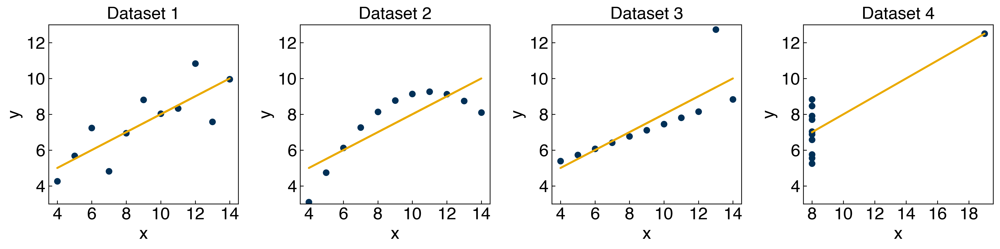

In [4]:
fig, axes = plt.subplots(1,4,figsize=(15,4))
yhat = m*x + b
axes[0].plot(x, y1, 'o')
axes[0].plot(x, yhat, ls = '-')

axes[1].plot(x, y2, 'o')
axes[1].plot(x, yhat, ls = '-')

axes[2].plot(x, y3, 'o')
axes[2].plot(x, yhat, ls = '-')

axes[3].plot(x4, y4, 'o')
axes[3].plot(x4, m * x4 + b, ls = '-')

for i, ax in enumerate(axes):
    if not i == 3:
        ax.set_xticks([4, 6, 8, 10, 12, 14])
    else:
        ax.set_xticks([8, 10, 12, 14, 16, 18])
    ax.set_ylim([3, 13])    
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title('Dataset {}'.format(str(i + 1)))

plt.show()

## Accuracy Metrics

It is important to consider the context of a regression model and choose accuracy metrics that are relevant to its application. There are several common options:

* #### $r^2$ value

The $r^2$ metric is very common in regression models, and is the default "score" in `scikit-learn`. $r^2$ varies from 0-1, with higher values corresponding to better models. The $r^2$ value corresponds to the amount of variance in the independent variable that is explained by the model, and is defined as:

$r^2 = \frac{\sum_{i=0}^N (y_i - \bar{y})^2 - \sum_{i=0}^N (y_i - \hat{y}_i)^2}{\sum_{i=0}^N (y_i - \bar{y})^2}$

where $\bar{y}$ is the mean of $y$. This is often written as:

$r^2 = \frac{SST - SSE}{SST}$

where $SST = \sum_{i=0}^N (y_i - \bar{y})^2$ and $SSE = \sum_{i=0}^N (y_i - \hat{y}_i)^2$

we can also think of this as the percent difference in squared error between our model, $\hat{y}_i$, and "no model", or just guessing that $y_i = \bar{y}$. If the sum of squared error for our model is not significantly lower than the sum of squared error when we just guess that $y_i = \bar{y}$ then the model is not very good.

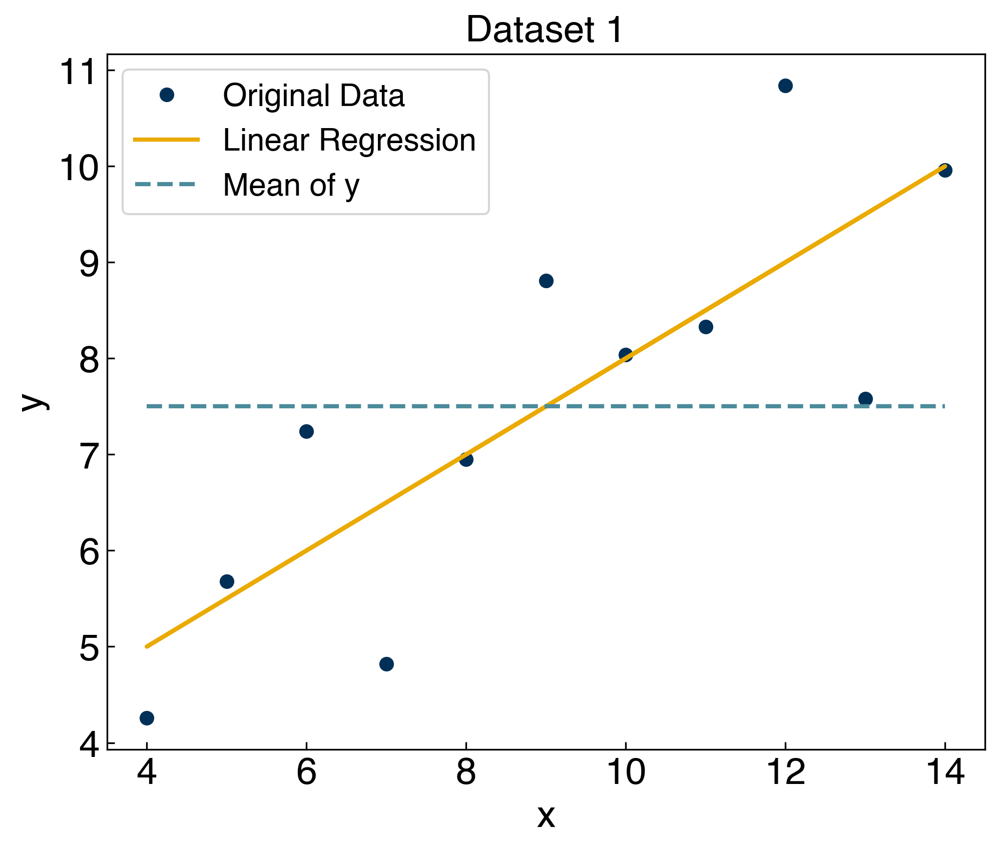

In [5]:
fig, ax = plt.subplots(figsize = (7, 6))
yhat = m * x + b
ax.plot(x, y1, 'o')
ax.plot(x, yhat, ls = '-')
ax.plot([min(x), max(x)], [np.mean(y1), np.mean(y1)], '--')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Dataset 1')
ax.legend(['Original Data', 'Linear Regression', 'Mean of y'])
plt.show()

### Discussion: What does a negative $r^2$ mean?

> The model is too bad.

* #### Mean absolute error (MAE)

$MAE = \frac{1}{N} \sum_{i=0}^N |y_i - \hat{y}_i|$

* #### Root-mean-sqaured error (RMSE)

$RMSE = \sqrt{\frac{1}{N} \sum_{i=0}^N (y_i - \hat{y}_i)^2}$

MAE and RMSE are very similar. Both have units of the dependent variable ($y$), and can vary from 0 to $\infty$ with lower values being better. MAE is less affected by outliers and sample size, but it is always lower than RMSE, so it is a less conservative estimate. MAE and RMSE are related by the inequalities:

$MAE \leq RMSE \leq MAE \times \sqrt{N}$

* #### Maximum error

Sometimes it is useful to assess the maximum error of a model, $max(\epsilon_i)$. This is useful to assess a worst-case scenario, and provides a conservative estimate of model performance.

* #### Parity plots

Plotting $y$ vs. $\hat{y}$ provides a visual analysis of the error. This can be particularly useful if your model is highly non-linear or has more than one input variable:

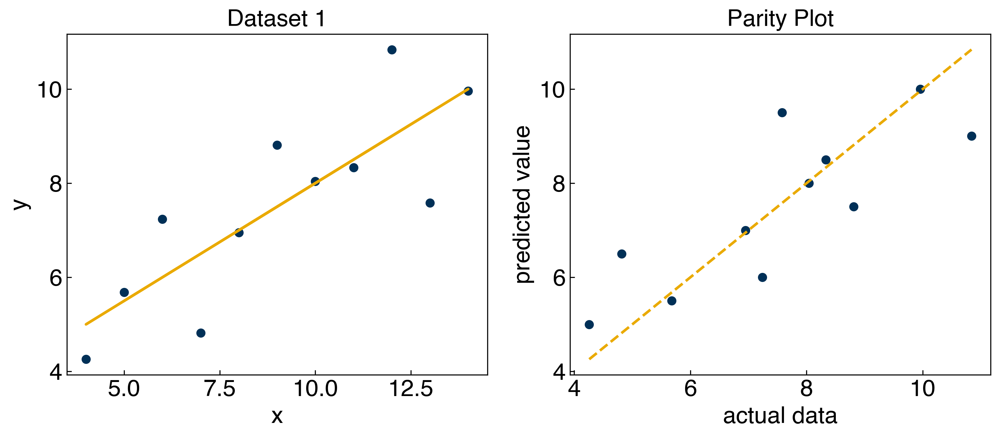

In [6]:
fig, axes = plt.subplots(1,2, figsize = (11, 5))
yhat = m*x + b

axes[0].plot(x, y1, 'o')
axes[0].plot(x, yhat, ls='-')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
axes[0].set_title('Dataset 1')

axes[1].plot(y1, yhat, 'o')
axes[1].plot([min(y1), max(y1)], [min(y1), max(y1)], ls='--')
axes[1].set_xlabel('actual data')
axes[1].set_ylabel('predicted value')
axes[1].set_title('Parity Plot')

plt.show()

* #### Error Histogram

You can create a histogram of the error between the model and the actual data. This can provide insight into whether the error is normally distributed or not.

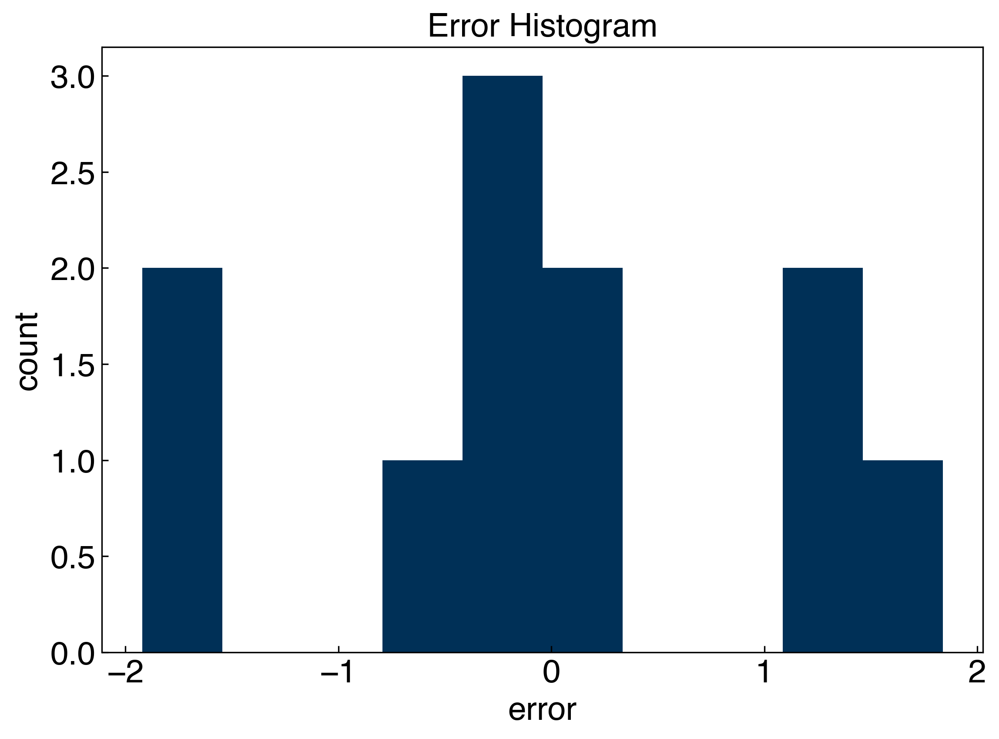

In [7]:
fig, ax = plt.subplots()
yhat = m * x + b
ax.hist(y1 - yhat, bins = 10)
ax.set_xlabel('error')
ax.set_ylabel('count')
ax.set_title('Error Histogram')
plt.show()

Computing quantitative metrics is a useful strategy, but you should always visualize your result to check for patterns in the error. Most regression model assume that the error distribution is:

* normally distributed: follows a Gaussian distribution with a mean of 0.
* homoscedastic: the standard deviation of the Gaussian distribution does not depend on the independent variable.

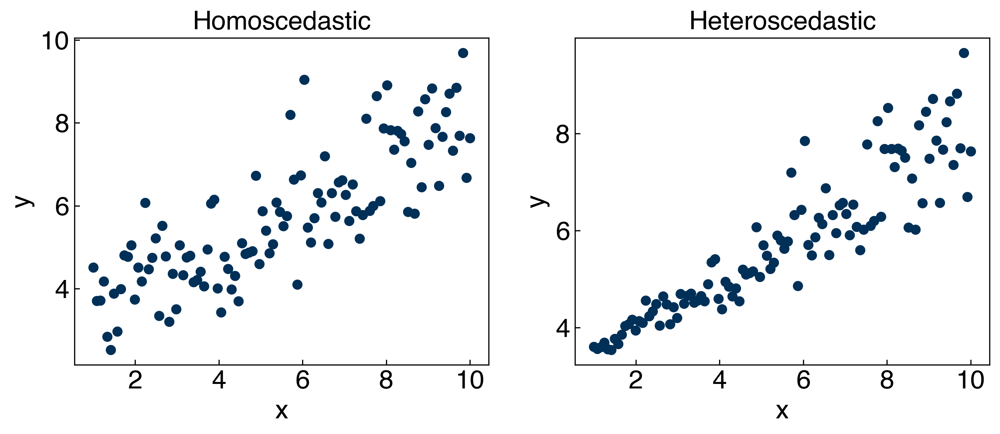

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
x_new = np.linspace(1, 10, 110)
yhat_new = m*x_new + b
noise = np.random.normal(size = len(x_new), loc = 0, scale = 1)
y_homoscedastic = yhat_new + noise
y_heteroscedastic = yhat_new + noise * x_new * 0.1

axes[0].plot(x_new, y_homoscedastic, 'o')
axes[0].set_title('Homoscedastic')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')

axes[1].plot(x_new, y_heteroscedastic, 'o')
axes[1].set_title('Heteroscedastic')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')

plt.show()

### Exercise: Create a parity plot for each dataset in Anscomb's quartet.

![image](./images/parityplot.png)

## Cross Validation

In the prior examples we computed error metrics for models that were trained with all available data. However, what we are really concerned with is how the model will perform on new data. Measuring new datapoints is often impractical when creating statistical models, but we can simulate this using "cross validation". In cross validation,  some examples ("test" examples) are hidden when the model is fit to "training" examples. Then, the loss function is assessed on the data that was hidden to see if the model is able to predict it.

There are many strategies for cross-validation:

* hold-out: randomly leave out a percentage (usually ~30%) of the data during training.
* k-fold: select `k` (usually 3-5) randomly-assigned sub-groups of data, and train `k` times holding each group out.
* leave p out: leave `p` (usually 1) samples out of the training and assess the error for the `p` that were left out. Repeat for all possible `p` subsets of the sample.
* bootstrapping: random selection with replacement to generate a sample of the same size as the original dataset, with a number of repetitions.

Different techniques can be used depending on how much data you have, and how much time you are willing to spend. Hold-out is fast and simple, but is susceptible to random good/bad subsamples, especially if the dataset is small. k-fold cross-validation alleviates the good/bad sample problem, but takes more time and effort. The "leave p out" approach is very computationally expensive if $p>1$. In the end, doing *any* cross validation is always better than doing *no* cross-validation, and it is usually a good idea to try a few approaches to convince yourself that your conclusions are not sensitive to the cross-validation approach you use.

All cross-validation techniques are based on an important (and often violated) assumption: *The collected data is representative of future data.* An example of when this might be violated in chemical engineering is that you have data collected at a given set of process conditions and build a model, but the process conditions are expected to when the model is applied.

### Hold out cross validation

Let's start by revisiting our spectrum dataset:

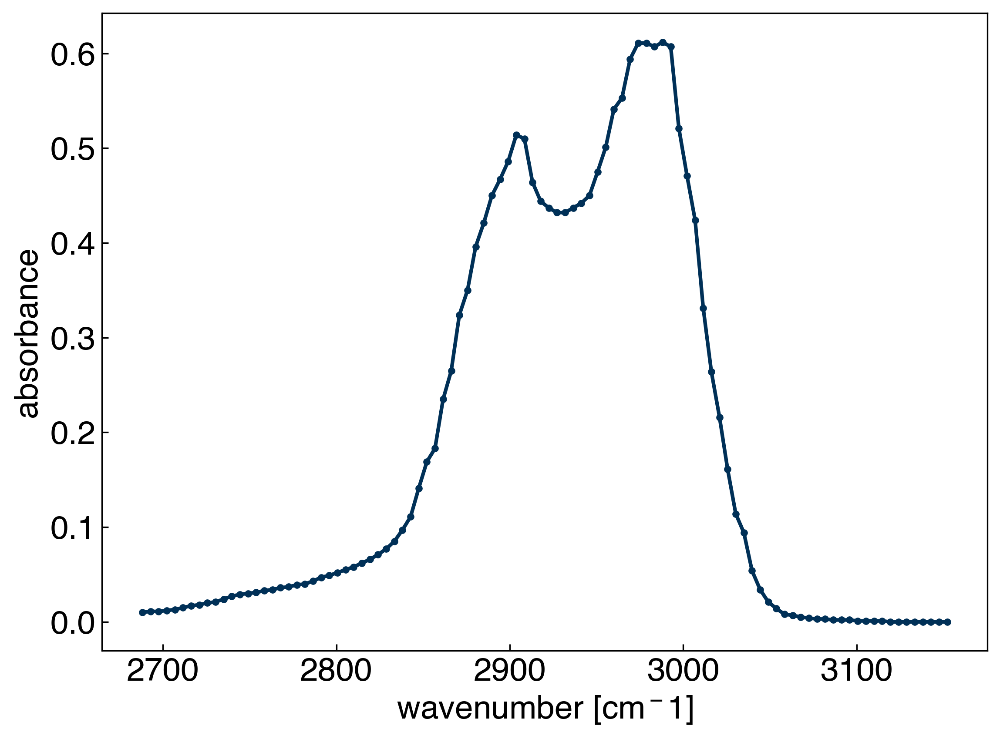

In [9]:
import pandas as pd

df = pd.read_csv('data/ethanol_IR.csv')
x_all = df['wavenumber [cm^-1]'].values
y_all = df['absorbance'].values

x_peak = x_all[475:575]
y_peak = y_all[475:575]

fig, ax = plt.subplots()
ax.plot(x_peak,y_peak, '-', marker='.')
ax.set_xlabel('wavenumber [$cm^-1$]')
ax.set_ylabel('absorbance');

We will start by looking at the case of regression with "radial basis function" kernels:

In [10]:
def rbf(x_train, x_test=None, gamma=1):
    if x_test is None:
        x_test = x_train
    N = len(x_test) #<- number of data points
    M = len(x_train) #<- number of features
    X = np.zeros((N,M))
    for i in range(N):
        for j in range(M):
            X[i,j] = np.exp(-gamma*(x_test[i] - x_train[j])**2)
    return X

We will revisit the problem of trying to determine the width of the kernels:

r^2 training = 1.0
r^2 testing = 0.9984890582179191


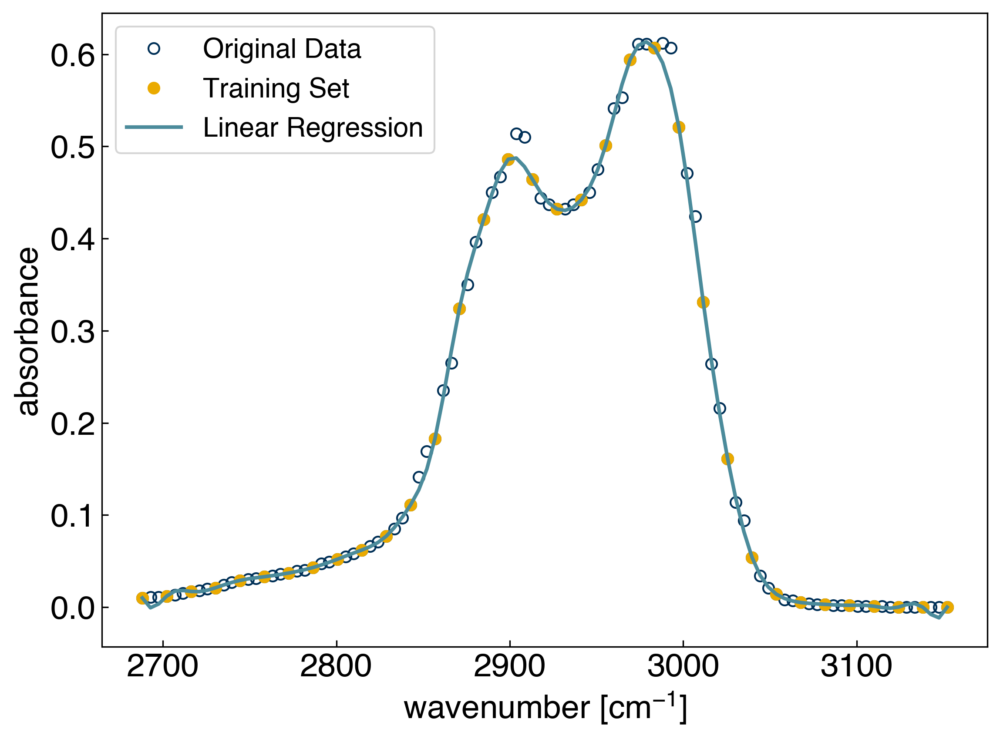

In [11]:
from sklearn.linear_model import LinearRegression

spacing = 3
sigma = 10
gamma = 1. / 2 / sigma**2

x_train = x_peak[::spacing]
y_train = y_peak[::spacing]

X_train = rbf(x_train, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_train) #fit the model
r2 = model_rbf.score(X_train, y_train) #get the "score", which is equivalent to r^2
print('r^2 training = {}'.format(r2))

X_all = rbf(x_train, x_test=x_peak, gamma=gamma)

yhat_rbf = model_rbf.predict(X_all) #create the model prediction

r2 = model_rbf.score(X_all, y_peak) #get the "score", which is equivalent to r^2
print('r^2 testing = {}'.format(r2))

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o', markerfacecolor='none')
ax.plot(x_train, y_train, 'o')
ax.plot(x_peak, yhat_rbf, '-')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Original Data', 'Training Set', 'Linear Regression'])

plt.show()

We can see that in this case we are actually doing a specific kind of "hold out", since we are training on every 3rd point, and testing on all the data. In standard hold out, we would randomly select some subset (usually ~60-80%) for *training* and use the remaining data for *testing*. This can get tedious to code, but luckily `scikit-learn` has some tools to help us:

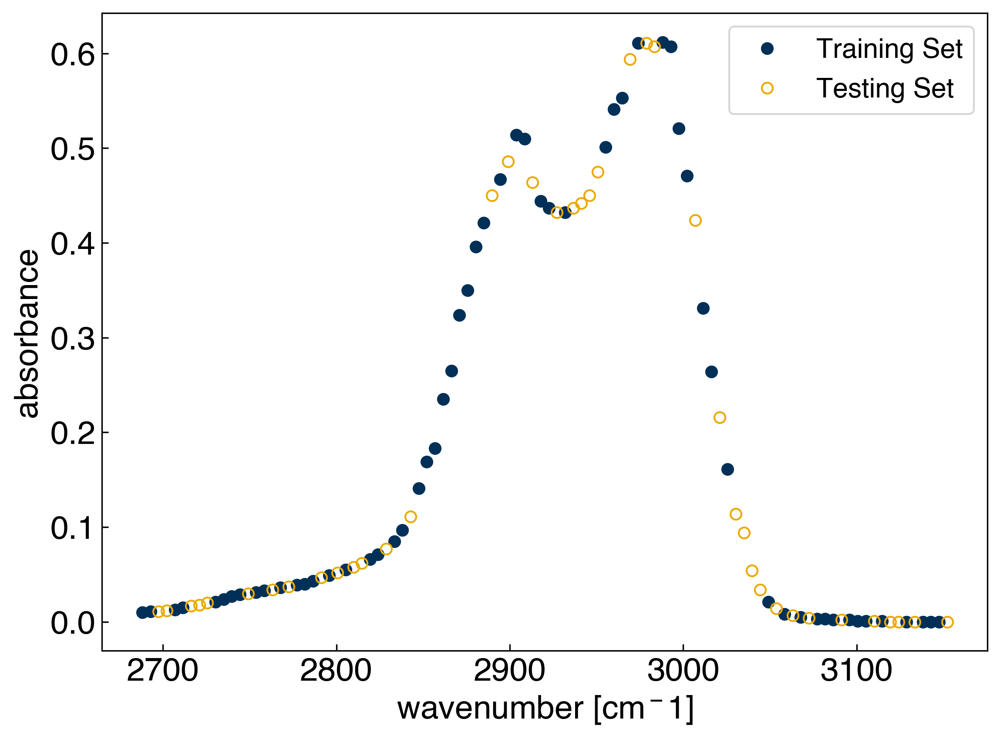

In [12]:
from sklearn.model_selection import train_test_split
np.random.seed(0)

x_train, x_test, y_train, y_test = train_test_split(x_peak, y_peak, test_size=0.4)

fig, ax = plt.subplots()

ax.plot(x_train, y_train, 'o')
ax.plot(x_test, y_test, 'o', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^-1$]')
ax.set_ylabel('absorbance')
ax.legend(['Training Set', 'Testing Set']);

Note the `np.random.seed(0)` line makes this cell run the same every time. If you remove it then it will give a different answer each time, or if you change the "seed" from 0 then you will get a different answer (but it will not change each time).

Now let's train on our train set and test on the test set:

r^2 training = 1.0
r^2 testing = -2.6660197469771107


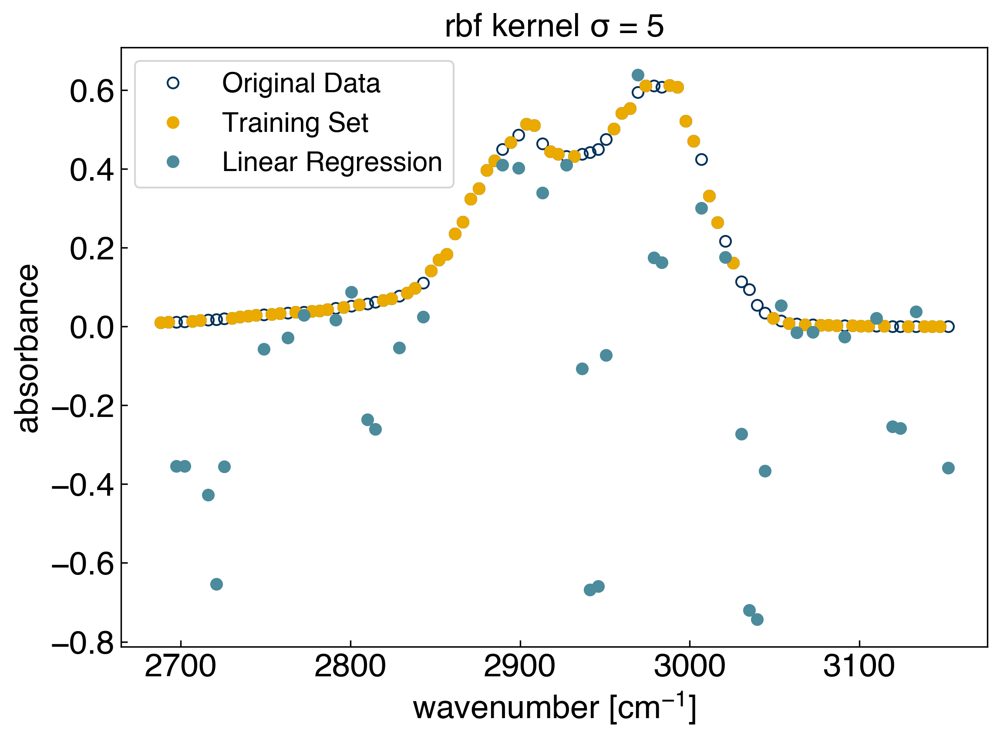

In [13]:
sigma = 5
gamma = 1. / 2 / sigma**2

X_train = rbf(x_train, gamma=gamma)

model_rbf = LinearRegression() #create a linear regression model instance
model_rbf.fit(X_train, y_train) #fit the model
r2 = model_rbf.score(X_train, y_train) #get the "score", which is equivalent to r^2
print('r^2 training = {}'.format(r2))

X_test = rbf(x_train, x_test=x_test, gamma=gamma)

yhat_rbf = model_rbf.predict(X_test) #create the model prediction

r2 = model_rbf.score(X_test, y_test) #get the "score", which is equivalent to r^2
print('r^2 testing = {}'.format(r2))

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o', markerfacecolor='none')
ax.plot(x_train, y_train, 'o')
ax.plot(x_test, yhat_rbf, 'o')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('rbf kernel $\sigma$ = {}'.format(str(sigma)))
ax.legend(['Original Data', 'Training Set', 'Linear Regression']);

We see that the model performs very poorly on the testing data if `sigma` is not chosen well. We can also visualize this with a parity plot:

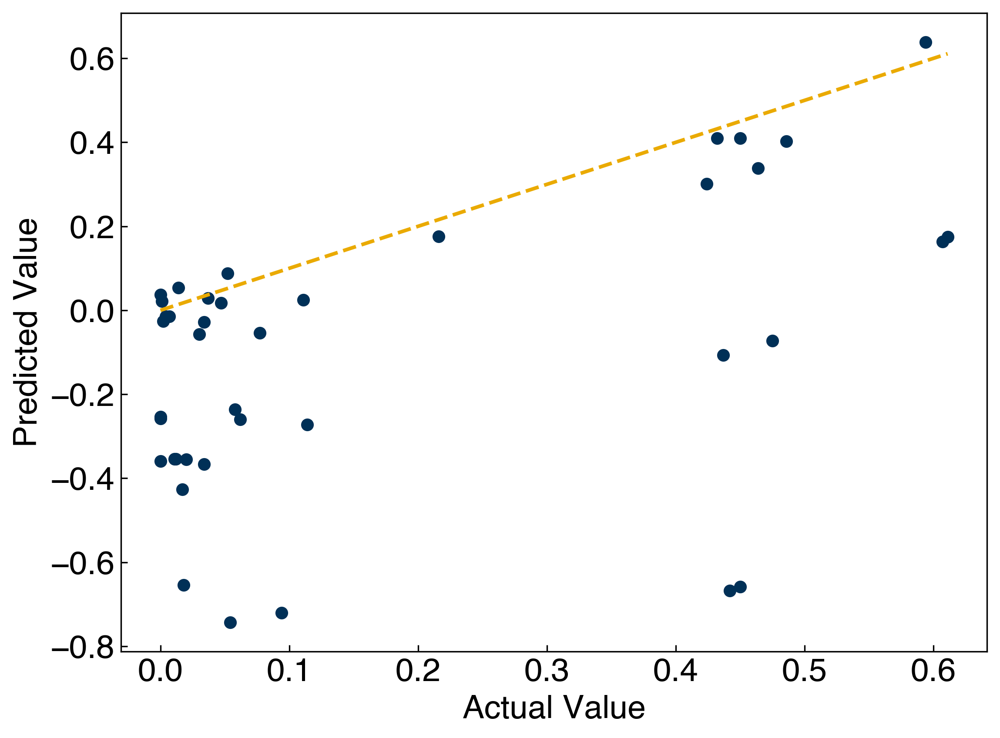

In [14]:
fig, ax = plt.subplots()

ax.plot(y_test, yhat_rbf, 'o')
ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)])
ax.set_xlabel("Actual Value")
ax.set_ylabel("Predicted Value");

### k-fold Cross Validation

Another approach is to use k-fold cross-validation. In this case, we get multiple estimates of the accuracy by repeating the holdout process with `k` different sub-samples of the data. Coding k-fold cross validation is even trickier than hold out, so we will use `scikit-learn` again:

r^2 training = 0.9985962657984412
r^2 testing = -1262384059.7447634
r^2 training = 0.9988328975441039
r^2 testing = 0.7270114703361121
r^2 training = 0.9988620627652702
r^2 testing = 0.7047036450121128
r^2 training = 0.9991067417585611
r^2 testing = 0.9473153434790846
r^2 training = 0.9986235726971027
r^2 testing = -31594905903.6079


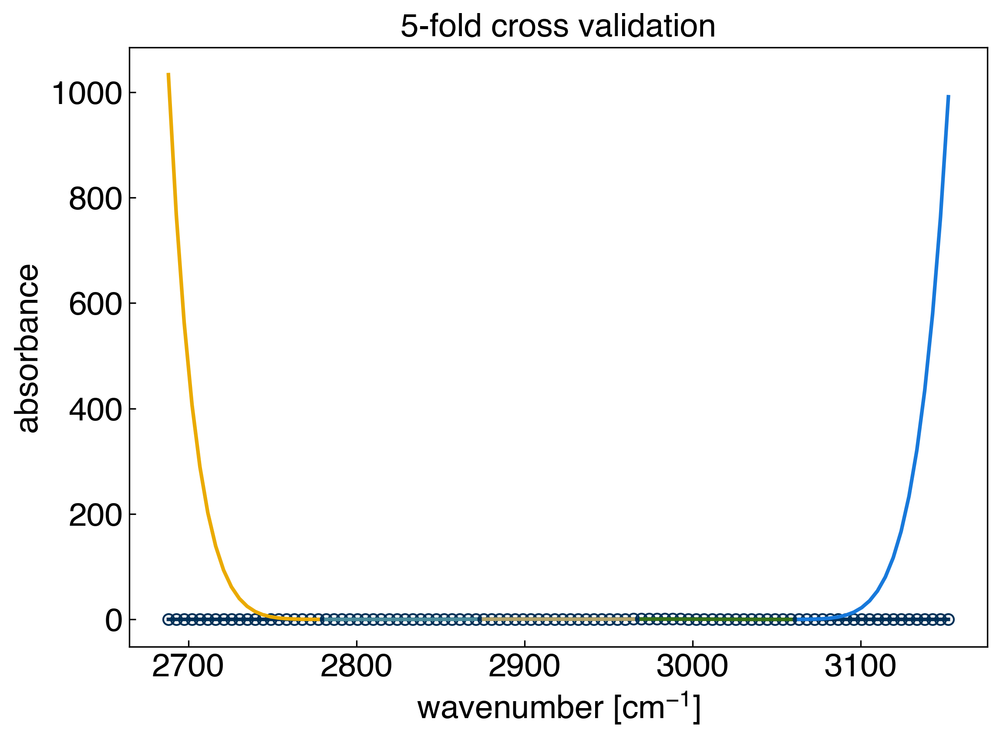

In [15]:
from sklearn.model_selection import KFold

kf = KFold(n_splits = 5)
sigma = 100
gamma = 1. / 2 / sigma**2

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, '-o', markerfacecolor='none')

r2_test = []

for train_index, test_index in kf.split(x_peak):
    x_train, x_test = x_peak[train_index], x_peak[test_index]
    y_train, y_test = y_peak[train_index], y_peak[test_index]
    
    X_train = rbf(x_train, gamma=gamma)

    model_rbf = LinearRegression() #create a linear regression model instance
    model_rbf.fit(X_train, y_train) #fit the model
    r2 = model_rbf.score(X_train, y_train) #get the "score", which is equivalent to r^2
    print('r^2 training = {}'.format(r2))

    X_test = rbf(x_train, x_test=x_test, gamma=gamma)

    yhat_rbf = model_rbf.predict(X_test) #create the model prediction

    r2 = model_rbf.score(X_test, y_test) #get the "score", which is equivalent to r^2
    print('r^2 testing = {}'.format(r2))
    r2_test.append(r2)
    
    ax.plot(x_test, yhat_rbf, '-')

ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.set_title('{}-fold cross validation'.format(str(kf.n_splits)));

When we use k-fold cross-validation we can see that the results depend a lot on exactly which test/train split we chose. In particular, if the end points are not included in the training set then the model tries to extrapolate and fails catastrophically. The advantage of k-fold cross-validation is it is harder to get lucky with your test/train split and accidentally find a split that makes your model look good. However, there is a tradeoff between number of splits and size of the split.

### Exercise: Use 8-fold cross-validation with $\sigma$=150 to compute the average and standard deviation of the mean absolute error across the 8 runs.

> `Mean of MAE: 0.019962713961172531`  
`Standard deviation of MAE: 0.014308286358453264`

## Quantifying Error and Uncertainty

In addition to model accuracy, it is often useful to have an estimate of the model error at a new predicted point. This is a slightly different problem, and we will look at a few approaches. We will go back to Anscomb's quartet to illustrate these more clearly.

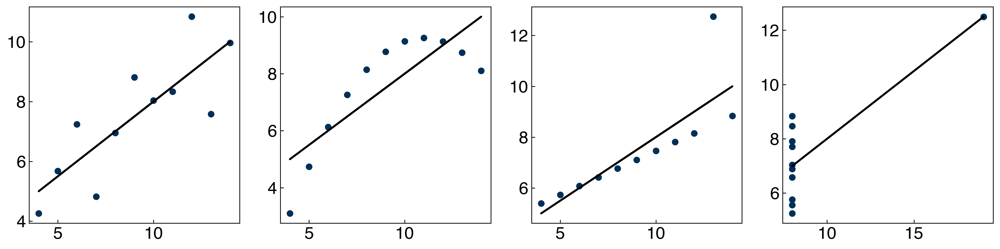

In [16]:
fig, axes = plt.subplots(1, 4, figsize = (15, 4))
yhat = m * x + b
axes[0].scatter(x, y1)
axes[0].plot(x, yhat, ls = '-', color = 'k')
axes[1].scatter(x, y2)
axes[1].plot(x, yhat, ls = '-', color = 'k')
axes[2].scatter(x, y3)
axes[2].plot(x, yhat, ls = '-', color = 'k')
axes[3].scatter(x4, y4)
axes[3].plot(x4, m*x4 + b, ls = '-', color = 'k');

### Standard Deviation of Error

One simple way of quantifying uncertainty is to assess the standard deviation of the error:

In [17]:
error_stdev = np.std(y3 - yhat, ddof = 2)
print(error_stdev)

1.2363120050122354


Note that we used `ddof=2` here, since we have 2 degrees of freedom removed due to the 2 parameters in the model. This doesn't really matter if you have very large datasets, but since these datasets are small (only 11 points) we need to account for it. Also note that the standard deviation is the same for each dataset in Anscomb's quartet.

We can use the following expression to account for how the uncertainty changes as a function of $x$:

$\vec{\sigma_y} = \sigma_{error} \sqrt{\left(1 + \frac{1}{n} + \frac{(\vec{x}-\bar{x})^2}{(\sum_j x_j - \bar{x})^2} \right)}$

where $\sigma_{error}$ is the standard deviation of the error.

However, this is only valid under the case that all assumptions of linear regression hold:

* Error is normally distributed
* Error is homoscedastic
* The relationship between the variables is linear

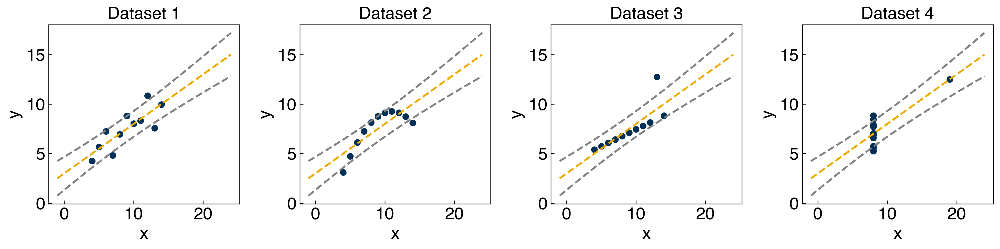

In [18]:
def regression_error(x,y, x_data, yhat):
    sigma_error = np.std(y-yhat, ddof=2)
    xbar = np.mean(x_data)
    y_error = sigma_error * np.sqrt(1 + 1/len(y) + ((x-xbar)**2)/(np.sum((x_data-xbar)**2)))
    return y_error

x_dense = np.linspace(min(x) - 5, max(x4) + 5, 50)

y_error = regression_error(x_dense, y1, x, m * x + b)

fig, axes = plt.subplots(1, 4, figsize = (15, 4))

axes[0].plot(x, y1, 'o')
axes[1].plot(x, y2, 'o')
axes[2].plot(x, y3, 'o')
axes[3].plot(x4, y4, 'o')

for i, ax in enumerate(axes):
    ax.plot(x_dense, m*x_dense+b)
    ax.plot(x_dense, m*x_dense+b + y_error, ls = '--', color = '0.5')
    ax.plot(x_dense, m*x_dense+b - y_error, ls = '--', color = '0.5')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title('Dataset {}'.format(str(i + 1)))

### Discussion: Are these uncertainty bounds valid for all datasets in Anscomb's quartet?

> Not at all. Uncertainty bounds do not look right for all datasets.

### Resampling or "bootstrapping"

Another possibility that avoids the assumptions of homoskedastic and normally-distributed errors is to use resampling techniques to generate a distribution of models. These models have distributions of parameters that capture the deviations in the data

There are many ways to achieve this, but one of the most popular is "bootstrapping". In a bootstrapping approach the data is re-sampled by choosing the same number of points `N` randomly from the real dataset, but this is done **with replacement** so that each re-sample is slightly different.

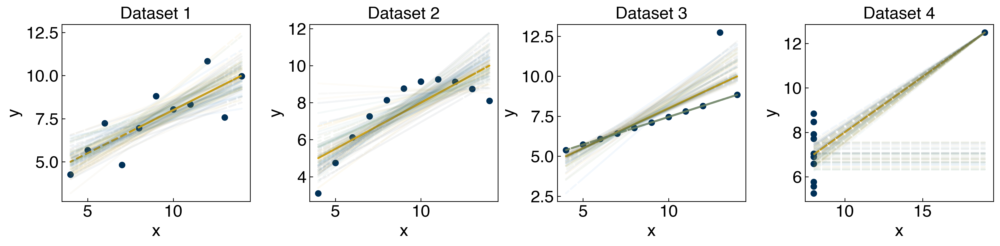

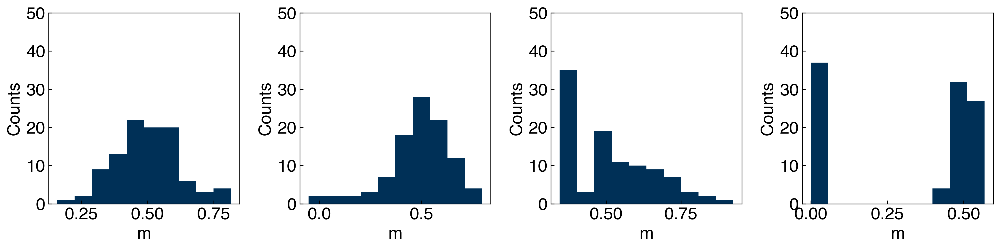

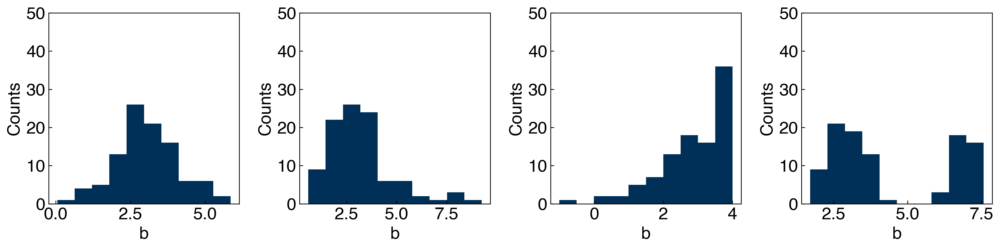

In [19]:
from numpy.random import choice #<- randomly select items from a list

def bootstrap_linregress(x_all, y_all, N):
    m_list = []
    b_list = []
    for n in range(N):
        subset = choice(range(len(x_all)), size=len(x_all), replace=True)
        xprime = [x_all[j] for j in subset]
        yprime = [y_all[j] for j in subset]
        if np.std(xprime) > 0:
            m, b = np.polyfit(xprime, yprime, deg=1)
        else:
            m = 0
            b = np.mean(yprime)
        
        m_list.append(m)
        b_list.append(b)
    return m_list, b_list

anscombs = [[x, y1], [x, y2], [x, y3], [x4, y4]]
fig, axes = plt.subplots(1, 4, figsize = (15, 4))
fig_m, axes_m = plt.subplots(1, 4, figsize = (15, 4))
fig_b, axes_b = plt.subplots(1, 4, figsize = (15, 4))

N = 100

for i, xy in enumerate(anscombs):
    xi, yi = xy
    m, b = np.polyfit(xi, yi, deg = 1)
    axes[i].plot(xi, yi, 'o')
    axes[i].plot(xi, m * xi + b, lw = 2)
    axes[i].set_xlabel('x')
    axes[i].set_ylabel('y')
    axes[i].set_title('Dataset {}'.format(str(i + 1)))

    
    m_list, b_list = bootstrap_linregress(xi, yi, N)
    for mj, bj in zip(m_list, b_list):
        axes[i].plot(xi, mj * xi + bj, alpha = 0.05)
        
    axes_m[i].hist(m_list)
    axes_m[i].set_xlabel('m')
    axes_m[i].set_ylabel('Counts')
    axes_m[i].set_ylim([0, 50])
    axes_b[i].hist(b_list)
    axes_b[i].set_xlabel('b')
    axes_b[i].set_ylabel('Counts')
    axes_b[i].set_ylim([0, 50])

You don't need to understand all the details of this code block, but should understand the general idea. Re-sampling is closely related to cross-validation. We hide some of the data from the model and see how the model changes. The difference is that we keep the **models**, rather than just analyzing the errors. Then we can use the models to give a range of estimates, or check the parameters of the models to see how much parameters change depending on the data.

This approach is very powerful because it allows us to get estimates of the prediction error as well as the error distribution of the parameters.

### Gaussian Process Regression

Gaussian process regression (GPR) is an extension of kernel regression that uses the distance of prediction points from the training points to estimate errors. The math behind this is beyond the scope of this course, but we will briefly demonstrate it for the spectra dataset:

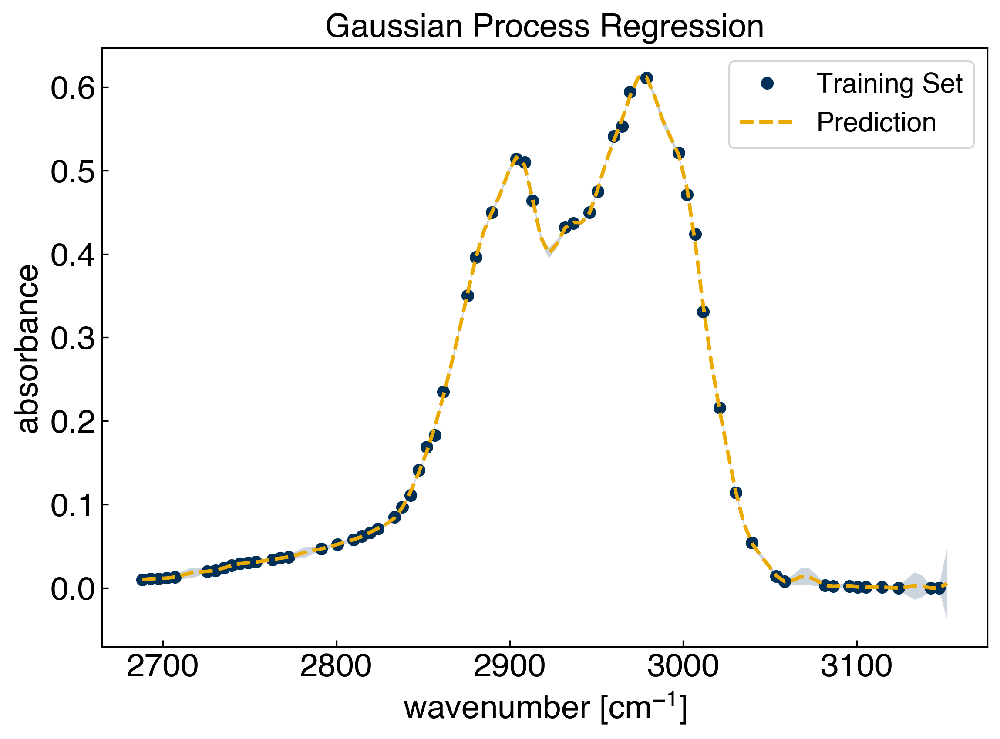

In [20]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

x_peak = x_peak.reshape(-1, 1)
y_peak = y_peak.reshape(-1, 1)
x_train, x_test, y_train, y_test = train_test_split(x_peak, y_peak, test_size = 0.4)

gpr = GaussianProcessRegressor(kernel = RBF(1), alpha = 0.000005)

gpr.fit(x_train, y_train)

y_gpr, y_std = gpr.predict(x_peak, return_std = True)

fig, ax = plt.subplots()
ax.plot(x_train, y_train, 'o')
ax.plot(x_peak, y_gpr, '--')
ax.fill_between(x_peak[:, 0], y_gpr[:, 0] - y_std, y_gpr[:, 0] + y_std, alpha = 0.2)
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Training Set', 'Prediction'])
ax.set_title('Gaussian Process Regression');

GPR is great for estimating uncertainty, but it is very sensitive to the input parameters and can be quite slow. We will not cover it in this course, but it is worth knowing about if you want to estimate uncertainty.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Information-Criteria" data-toc-modified-id="Information-Criteria-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Information Criteria</a></span><ul class="toc-item"><li><span><a href="#Exercise:-Use-the-BIC-to-determine-the-optimum-number-of-evenly-spaced-Gaussians-for-the-spectra" data-toc-modified-id="Exercise:-Use-the-BIC-to-determine-the-optimum-number-of-evenly-spaced-Gaussians-for-the-spectra-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Exercise: Use the BIC to determine the optimum number of evenly-spaced Gaussians for the spectra</a></span></li></ul></li><li><span><a href="#Regularization" data-toc-modified-id="Regularization-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Regularization</a></span><ul class="toc-item"><li><span><a href="#Discussion:-Why-is-the-&quot;smoothness&quot;-of-a-model-related-to-the-size-of-its-parameters?" data-toc-modified-id="Discussion:-Why-is-the-&quot;smoothness&quot;-of-a-model-related-to-the-size-of-its-parameters?-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Discussion: Why is the "smoothness" of a model related to the size of its parameters?</a></span></li><li><span><a href="#Discussion:-What-happens-as--$\alpha-\rightarrow$-0-and-$\alpha-\rightarrow$-$\infty$?" data-toc-modified-id="Discussion:-What-happens-as--$\alpha-\rightarrow$-0-and-$\alpha-\rightarrow$-$\infty$?-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Discussion: What happens as  $\alpha \rightarrow$ 0 and $\alpha \rightarrow$ $\infty$?</a></span></li><li><span><a href="#Exercise:-Use-cross-validation-to-determine-the-optimal-value-of-$\alpha$-when-$\sigma=20$." data-toc-modified-id="Exercise:-Use-cross-validation-to-determine-the-optimal-value-of-$\alpha$-when-$\sigma=20$.-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Exercise: Use cross validation to determine the optimal value of $\alpha$ when $\sigma=20$.</a></span></li></ul></li><li><span><a href="#LASSO-Regularization" data-toc-modified-id="LASSO-Regularization-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>LASSO Regularization</a></span></li><li><span><a href="#Hyperparameter-Tuning" data-toc-modified-id="Hyperparameter-Tuning-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Hyperparameter Tuning</a></span><ul class="toc-item"><li><span><a href="#Exercise:-Optimize-the-hyperparameters-of-a-LASSO-model-for-the-spectrum-data" data-toc-modified-id="Exercise:-Optimize-the-hyperparameters-of-a-LASSO-model-for-the-spectrum-data-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Exercise: Optimize the hyperparameters of a LASSO model for the spectrum data</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

# Complexity Optimization

The key to machine learning is creating models that generalize to new examples. This means we are looking for models with enough complexity to describe the behavior, but not so much complexity that it just reproduces the data points.

<center>
<img src="images/underfitting_overfitting.png" width="800">
</center>

* Underfitting: The model is just "guessing" at the data, and will be equally bad at the data it has been trained on and the data that it is tested on.

* Overfitting: The model has memorized all of the training data, and will be perfect on training data and terrible on testing data.

* Optimal complexity: The model has *learned* from the training data and can *generalize* to the training data. The performance should be approximately as good for both sets.

Consider the general form of a machine-learning model introduced earlier:

$\vec{y} = f(\vec{x}, \vec{w}(\vec{\eta}))$
 
 The "complexity" of a model is defined by its hyperparameters ($\vec{\eta}$). The goal of machine learning is to **optimize the complexity** of a model so that it **generalizes to new examples**. In order to achieve this goal we first need a way to quantify complexity so that we can optimize it.
 
 In general there are a few strategies:
 
 * Number of parameters: "Complexity" varies linearly with number of parameters
 * Information criteria: "Complexity" varies with number of parameters and is balanced by the model error.
 * "Smoothness": "Complexity" is related to the maximum curvature of the model
 
><em>"With four parameters I can fit an elephant, and with five I can make him wiggle his trunk."</em> <br/>
> \- John von Neumann \-
 
 (see an [example here](https://www.johndcook.com/blog/2011/06/21/how-to-fit-an-elephant/))

## Information Criteria

The idea behind an "information criterion" is that it quantifies the tradeoff between the number of parameters and the model error. The most commonly used information criterion is the "Bayesian Information Criterion", or BIC. The derivation of the BIC is beyond the scope of this course, but conceptually a lower BIC corresponds to a *more* probable model.

If we assume that our error is normally distributed, the BIC can be easily computed as:

$ BIC = n\times\ln{(\sigma^2_e)} + k\times\ln(n)$

where $n$ is the number of data points, $\sigma_e$ is the standard deviation of the error, and $k$ is the number of parameters.

There are a few other "information critera", with the Akaike Information Criterion, or AIC, being the other most commonly used. For now we will just consider the BIC, but they typically yield similar optimal models.

Let's implement the BIC in Python:

In [2]:
def BIC(y, yhat, k):
    err = y - yhat
    sigma = np.std(np.real(err))
    n = len(y)
    B = n*np.log(sigma**2) + k*np.log(n)
    return B

Now we will apply it to models with the spectra dataset:

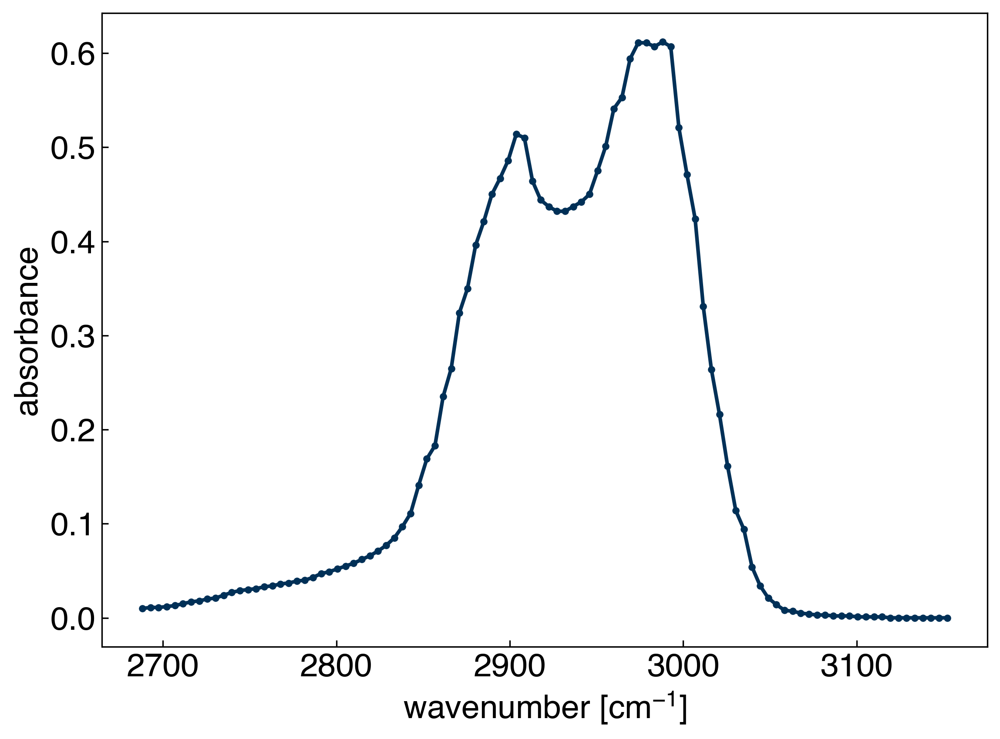

In [3]:
import numpy as np
import pandas as pd

df = pd.read_csv('data/ethanol_IR.csv')
x_all = df['wavenumber [cm^-1]'].values
y_all = df['absorbance'].values

x_peak = x_all[475:575]
y_peak = y_all[475:575]

fig, ax = plt.subplots()
ax.plot(x_peak,y_peak, '-', marker='.')
ax.set_xlabel('wavenumber [cm$^{-1}$]')
ax.set_ylabel('absorbance');

Now, let's compare some of the many different models we have used for modeling the spectrum from the previous module and this module. We will look at the following models:

* Polynomial regression with 40 polynomials (40 parameters)
* Gaussian regression 20 evenly-spaced Gaussians (20 parameters)

We will re-implement the polynomial and Gaussian regressions using `scikit-learn` to make things easier:

In [4]:
from sklearn.linear_model import LinearRegression

def polynomial_features(x, N):
    # function to return a matrix of polynomials for x to order N
    # One-liner uses "list comprehension" to iterate through range 0 - N (note N+1 since range function is not inclusive)
    # The input, x, is raised to the power of N for each value of N
    # The result is converted to an array and transposed so that columns correspond to features and rows correspond to data points (individual x values)
    return np.array([x**k for k in range(0,N)]).T

N = 40
X_poly = polynomial_features(x_peak, N)

LR_poly = LinearRegression() #create a linear regression model instance
LR_poly.fit(X_poly, y_peak) #fit the model
yhat_poly = LR_poly.predict(X_poly)

BIC_poly = BIC(y_peak, yhat_poly, N)
print(BIC_poly)

-283.0752960301787


In [5]:
def gaussian_features(x, N , sigma = 25):
    # x is a vector
    # sigma is the standard deviation
    xk_vec = np.linspace(min(x), max(x), N)
    features = []
    for xk in xk_vec:
        features.append(np.exp(-((x - xk)**2/(2*sigma**2))))
    return np.array(features).T

N = 20
X_gauss = gaussian_features(x_peak, N)

LR_gauss = LinearRegression() #create a linear regression model instance
LR_gauss.fit(X_gauss, y_peak) #fit the model
yhat_gauss = LR_gauss.predict(X_gauss)

BIC_gauss = BIC(y_peak, yhat_gauss, N)
print(BIC_gauss)

-896.252613200568


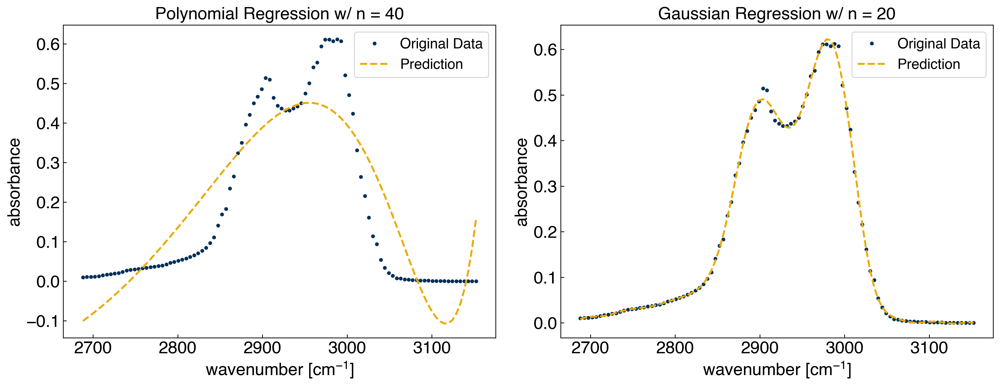

In [6]:
fig, axes = plt.subplots(1,2, figsize = (15, 6))
axes[0].plot(x_peak, y_peak, '.')
axes[1].plot(x_peak, y_peak, '.')

axes[0].plot(x_peak, yhat_poly, '--')
axes[1].plot(x_peak, yhat_gauss, '--')

for ax in axes:
    ax.set_xlabel('wavenumber [$cm^{-1}$]')
    ax.set_ylabel('absorbance')
    ax.legend(['Original Data', 'Prediction'])
    
axes[0].set_title('Polynomial Regression w/ n = 40')
axes[1].set_title('Gaussian Regression w/ n = 20');

We can see that the BIC correctly predicts that the Gaussian model is preferred.

### Exercise: Use the BIC to determine the optimum number of evenly-spaced Gaussians for the spectra

![image](./images/BIC.png)

There are numerous other "information criteria" that can be used in a similar way. Another common one is the "Aikake information criterion":

$ AIC = 2\times(\ln{(\sigma^2_e)} + k)$

This is derived from a slightly different set of statistical assumptions. There are other criteria as well, and you can find them in the statistical literature if needed. However, it can often be very challenging to determine if your dataset fits the assumptions of the criteria, and in practice it is common to just use BIC. However, without knowing the details of the statistical assumptions these are not rigorous and should not be used as a substitute for common sense or intuition. However, the general idea of balancing number of parameters and model error provides a solid framework for thinking about complexity optimization.

One other challenge with information criteria is that non-parametric models have parameters that are not defined in the same way (the parameters and their values change depending on the training data). This makes it difficult (or impossible) to apply information critera with non-parametric models.

## Regularization

Another way of penalizing complexity is by trying to penalize models that change very sharply. This is achieved by adding a penalty for parameters with very large values in the loss function. For example:

$L = \sum_i \epsilon_i^2 + \alpha \sqrt{\sum_j w_j^2}$

In this case, we introduce a new hyperparameter, $\alpha$, which controls the strength of regularization. We also choose to regularize on the square root of the sum of squared parameters, which is often called the "L2 norm" and written as:

$L = \sum_i \epsilon_i^2 + \alpha ||\vec{w}||_2$

We can also regularize in other ways, which can have advantages in some cases. We will discuss this more later, but will focus on the L2 norm for now.

### Discussion: Why is the "smoothness" of a model related to the size of its parameters?

> Take the second derivative. The larger w$_{j}$, the larger the derivative would be.

Regularization is especially critical in the case of non-parametric models, where the number of parameters is always greater than the number of data points. If we use a kernel and regularize on the sum of squared parameters it is called **Kernel Ridge Regression**, or KRR. We will not derive the equations here, but it can be done analytically (Hint: You should think about how you would do this).

We will just use the `scikit-learn` implementation for now:

In [7]:
from sklearn.kernel_ridge import KernelRidge
#help(KernelRidge)

If we look at the parameters we see that we need to specify which kernel to use (we will use `rbf`), the `gamma` value corresponding to the width of the kernel, and `alpha` corresponding to the regularization strength. You are already familiar with the `rbf` kernel and `gamma` from the non-parametric models lecture. The only new thing here is the regularization strength, `alpha`.

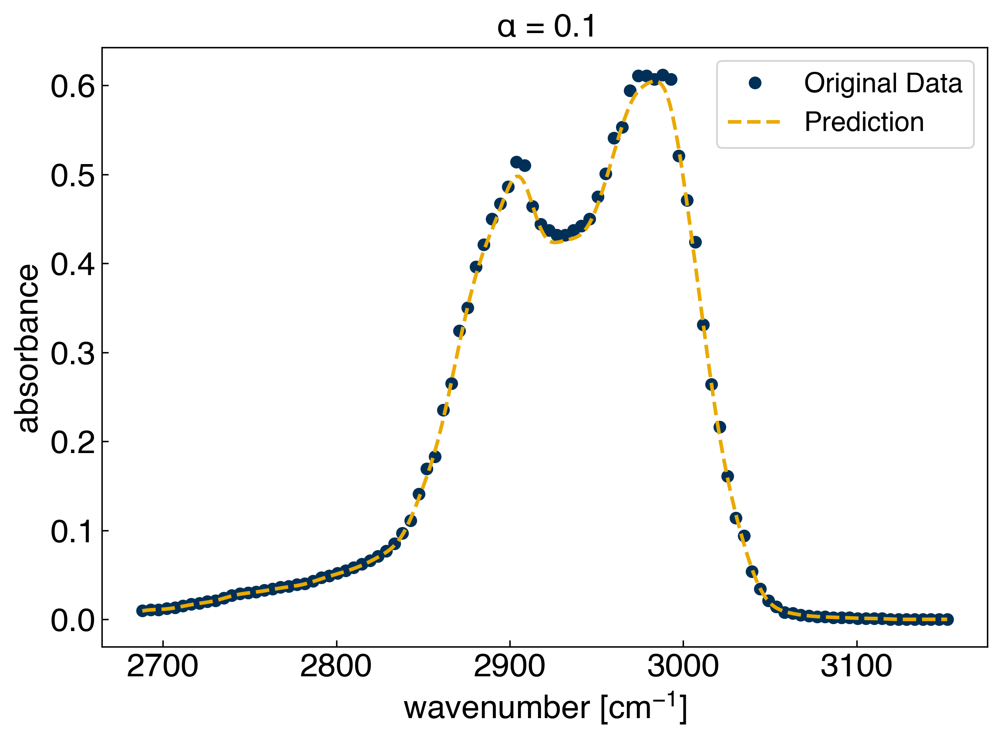

In [8]:
sigma = 10
gamma = 1./(2*sigma**2)

alpha = 0.1

KRR = KernelRidge(alpha=alpha, kernel='rbf', gamma=gamma)
x_peak = x_peak.reshape(-1,1) #we need to convert these to columns
y_peak = y_peak.reshape(-1,1)

KRR.fit(x_peak, y_peak)

x_predict = np.linspace(min(x_peak), max(x_peak), 300) #create prediction data
yhat_KRR = KRR.predict(x_predict)

fig, ax = plt.subplots()
ax.plot(x_peak, y_peak, 'o')
ax.plot(x_predict, yhat_KRR, '--', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Original Data', 'Prediction'])
ax.set_title(r'$\alpha$ = {}'.format(alpha));

### Discussion: What happens as  $\alpha \rightarrow$ 0 and $\alpha \rightarrow$ $\infty$?

> $\alpha \rightarrow$ 0: no regularization  
$\alpha \rightarrow \infty$: flat line

We see that the regularization clearly affects the model, but sometimes it seems to make it worse. We need some strategy for assessing what value of regularization to choose. We can go back to the idea of cross-validation to achieve this:

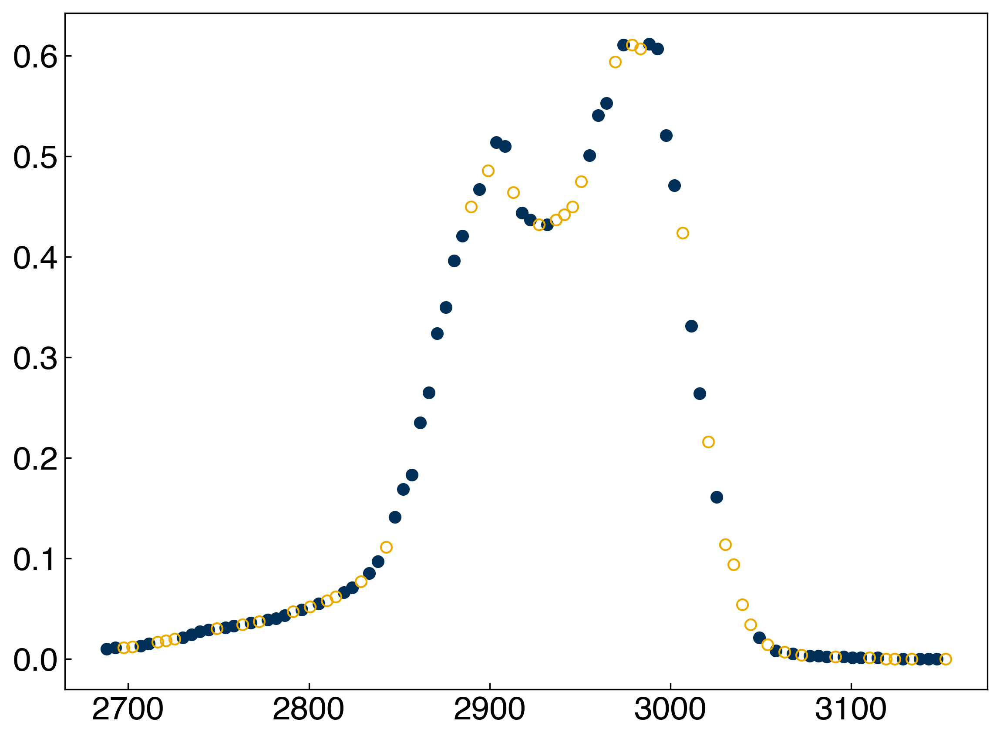

In [9]:
from sklearn.model_selection import train_test_split
np.random.seed(0)

x_train, x_test, y_train, y_test = train_test_split(x_peak, y_peak, test_size=0.4)

fig, ax = plt.subplots()

ax.plot(x_train, y_train, 'o')
ax.plot(x_test, y_test, 'o', markerfacecolor='none');

We can use hold out to compute the error on the testing data as we vary the regularization strength:

r2 on the test set: 0.9816791895375319


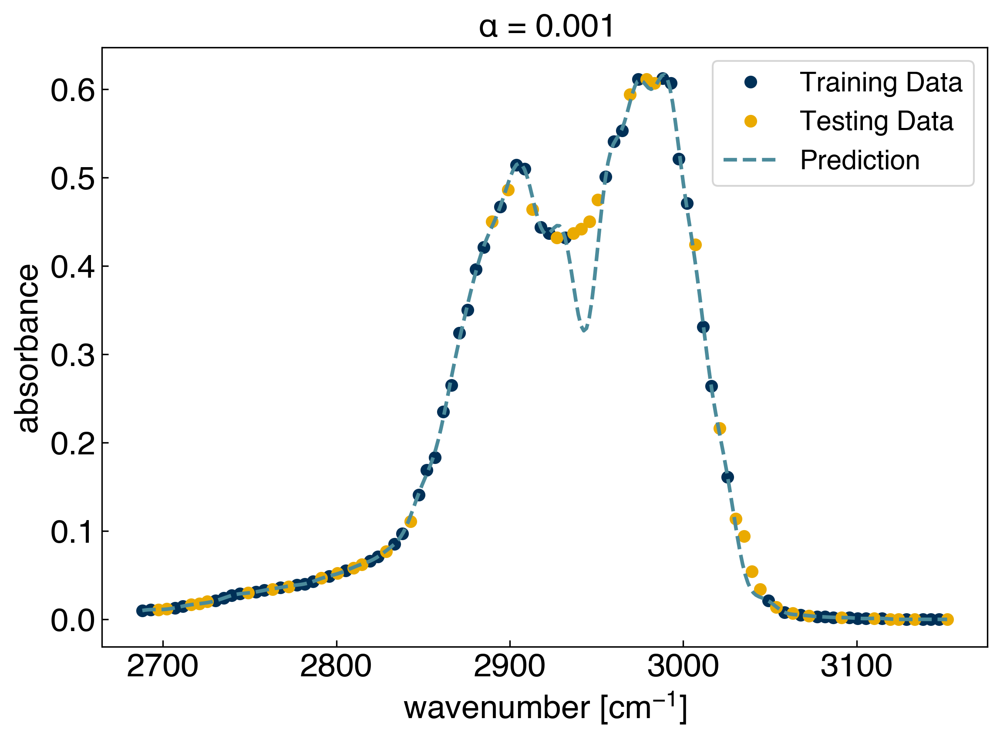

In [10]:
sigma = 10
gamma = 1. / 2 / sigma**2

alpha = 1e-3

KRR = KernelRidge(alpha=alpha, kernel='rbf', gamma=gamma)
KRR.fit(x_train, y_train)

x_predict = np.linspace(min(x_peak), max(x_peak), 300) #create prediction data
yhat_KRR = KRR.predict(x_predict)

r2_test = KRR.score(x_test, y_test)
print('r2 on the test set: {}'.format(r2_test))

fig, ax = plt.subplots()
ax.plot(x_train, y_train, 'o')
ax.plot(x_test, y_test, 'o');
ax.plot(x_predict, yhat_KRR, '--', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Training Data', 'Testing Data', 'Prediction'])
ax.set_title(r'$\alpha$ = {}'.format(alpha));

You can also see how the regularization affects the parameters, $\vec{w}$, by looking at the (not intuitively named) `dual_coef_` attribute of the KRR model:

The model has 60 coefficients.
The largest coefficient is 10.984.


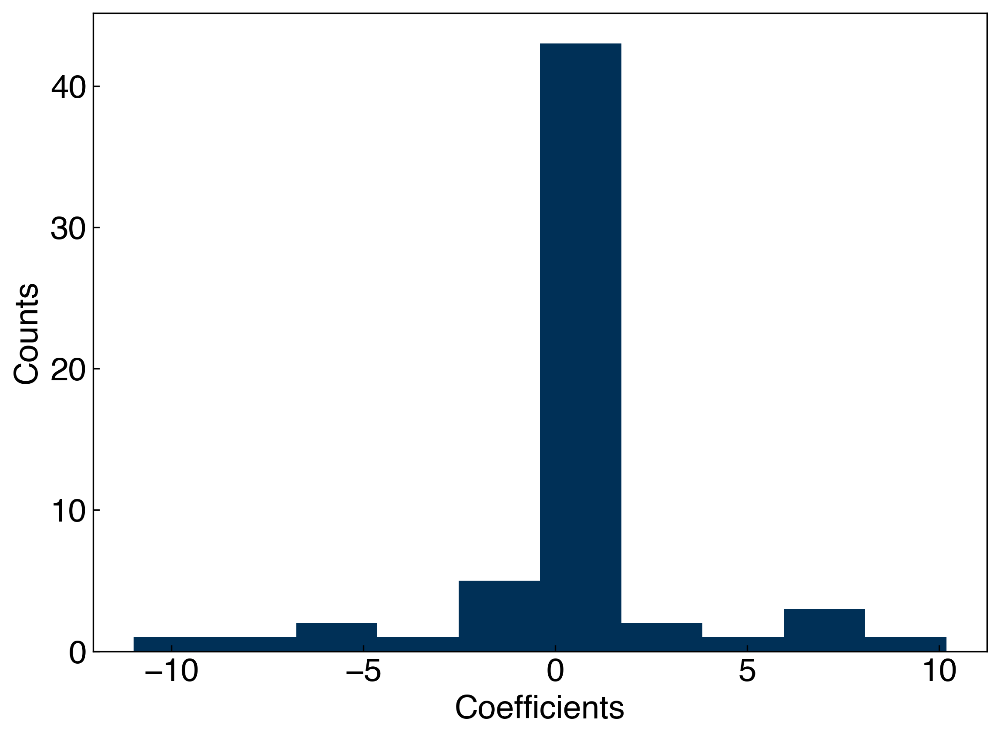

In [11]:
coeffs= KRR.dual_coef_
print('The model has {} coefficients.'.format(len(coeffs)))

fig, ax = plt.subplots()
ax.hist(coeffs)
ax.set_xlabel('Coefficients')
ax.set_ylabel('Counts')
print('The largest coefficient is {:.3f}.'.format(max(abs(coeffs))[0]));

### Exercise: Use cross validation to determine the optimal value of $\alpha$ when $\sigma=20$.

![image](./images/optimalAlpha.png)

## LASSO Regularization

Ridge regression provides a good way to penalize model "smoothness", but it doesn't actually reduce the number of parameters. We can see that all of the coefficients are non-zero:

In [12]:
nonzero = [f for f in np.isclose(coeffs,0) if f == False]
print('Total number of non-zero parameters: {}'.format(len(nonzero)))

Total number of non-zero parameters: 60


Ideally we could also use regularization to reduce the number of parameters. It turns out that this can be achieved using the L1 norm:

$||L_1|| = \sum_i |w_i|$

where $|.|$ is the absolute value. This is called "least absolute shrinkage and selection operator" regression, which is a terrible name with a great acronym: LASSO. The loss function for LASSO is defined as:

$L_{LASSO} = \sum_i \epsilon_i^2 + \alpha ||\vec{w}||_1$

This can be compared to the loss function for ridge regression:

$L_{ridge} = \sum_i \epsilon_i^2 + \alpha ||\vec{w}||_2$

We will not go through the derivation of *why* the L1 norm causes parameters to go to zero, but the following schematic, borrowed from [this website](https://niallmartin.wordpress.com/2016/05/12/shrinkage-methods-ridge-and-lasso-regression/) may be useful (note that $\vec{\beta}$ is equivalent to $\vec{w}$:

<center>
<img src="images/lasso_vs_ridge_regression.png" width="600">
</center>

We can also test it using `scikit-learn`. Unfortunately, we need to create our own feature (basis) matrix, $X_{ij}$, similar to linear regression, so we will need a function to evaluate the `rbf`. Instead of using our own, we can use the one from `scikit-learn`:

In [13]:
from sklearn.metrics.pairwise import rbf_kernel

sigma = 10
gamma = 1./(2*sigma**2)

X_train = rbf_kernel(x_train, x_train, gamma=gamma)

The number of coefficients: 60


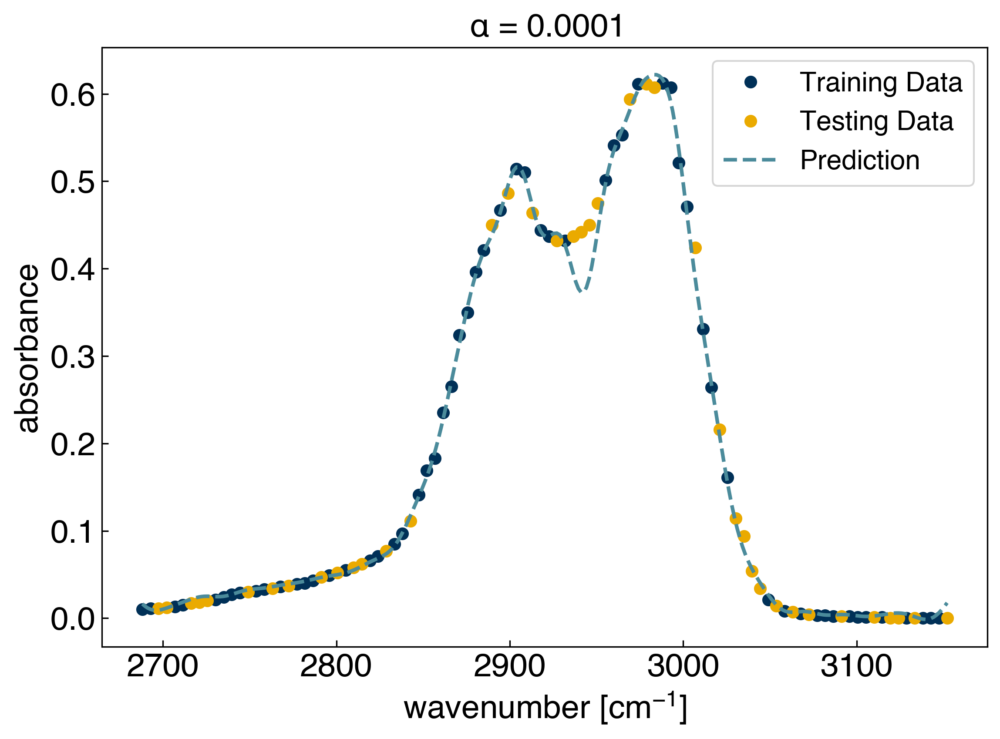

In [14]:
from sklearn.linear_model import Lasso

sigma = 10
gamma = 1./(2*sigma**2)

alpha = 1e-4

LASSO = Lasso(alpha=alpha)
LASSO.fit(X_train, y_train)
print('The number of coefficients: {}'.format(len(LASSO.coef_)))

x_predict = np.linspace(min(x_peak), max(x_peak), 300) #create prediction data
X_predict = rbf_kernel(x_predict, x_train, gamma=gamma)

yhat_LASSO = LASSO.predict(X_predict)

fig, ax = plt.subplots()
ax.plot(x_train, y_train, 'o')
ax.plot(x_test, y_test, 'o')
ax.plot(x_predict, yhat_LASSO, '--')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Training Data', 'Testing Data', 'Prediction'])
ax.set_title(r'$\alpha$ = {}'.format(alpha));

The results look similar to KRR. Now we can see how many non-zero parameters there are, and check the parameter values:

Total number of non-zero parameters: 41


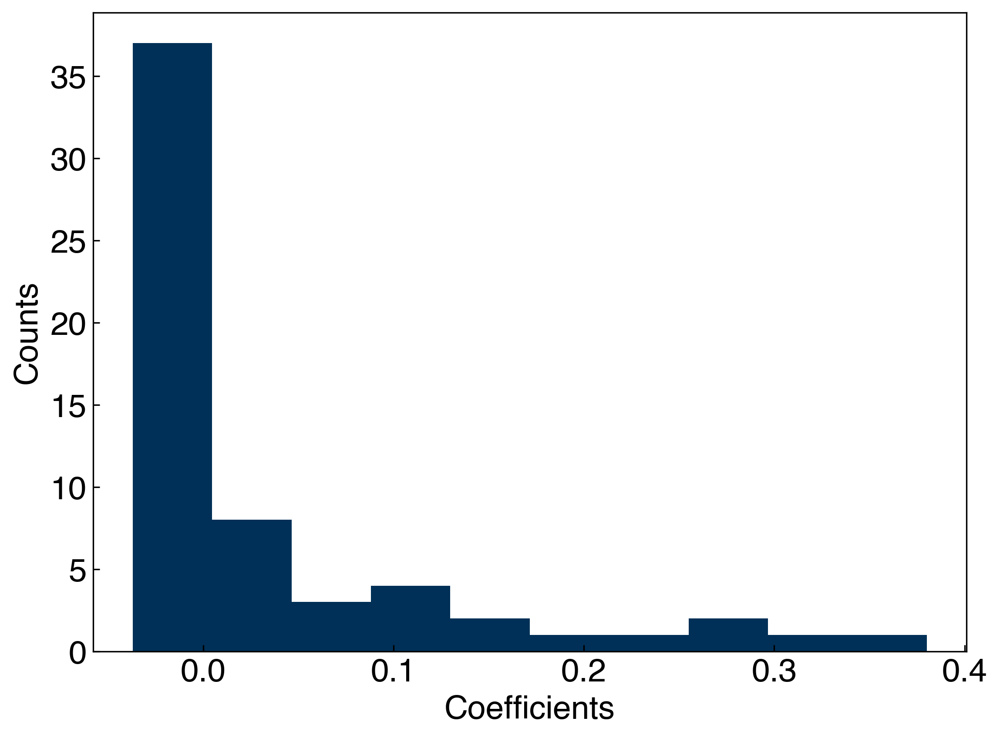

In [15]:
coeffs = LASSO.coef_

fig, ax = plt.subplots()
ax.hist(coeffs)
ax.set_xlabel('Coefficients')
ax.set_ylabel('Counts')

nonzero = [f for f in np.isclose(coeffs,0) if f == False]
print('Total number of non-zero parameters: {}'.format(len(nonzero)))

We see that the LASSO regularization has a lot of coefficients that are equal to zero. This is equivalent to discarding these terms and finding which Gaussians should (or should not) be included.

## Hyperparameter Tuning

The KRR and LASSO models above have 2 hyperparameters: $\gamma$ $\left(=\frac{1}{2\sigma^2}\right)$ and $\alpha$. So far, we have optimized $\alpha$, but the model performance (and optimal $\alpha$) will also depend on $\sigma$. You can probably see that optimizing these will get rather tedious.

Fortunately, `scikit-learn` has some nice built-in tools to help. The most commonly used is `GridSearchCV`, which is a brute-force approach that searches over a grid of hyperparameters, and uses cross-validation at each grid point to assess model performace.

Here we will use GridSearchCV to find the optimum KRR model and its score (related to $R^2$):

In [16]:
from sklearn.model_selection import GridSearchCV

sigmas = np.array([5, 10, 15, 20, 25, 30,35, 40])
gammas = 1./(2*sigmas**2)

alphas = np.array([1e-9, 1e-5, 1e-4,1e-3, 1e-2,1e-1, 1])

parameter_ranges = {'alpha':alphas, 'gamma':gammas}

KRR = KernelRidge(kernel='rbf')

KRR_search = GridSearchCV(KRR, parameter_ranges, cv=3)
KRR_search.fit(x_train,y_train)
KRR_search.best_estimator_, KRR_search.best_score_

(KernelRidge(alpha=0.01, gamma=0.0005555555555555556, kernel='rbf'),
 0.9953287405140007)

This tells us that the best performance comes from a model with $\alpha=0.01$ and $\gamma=0.000555$. We can check the performance of the model:

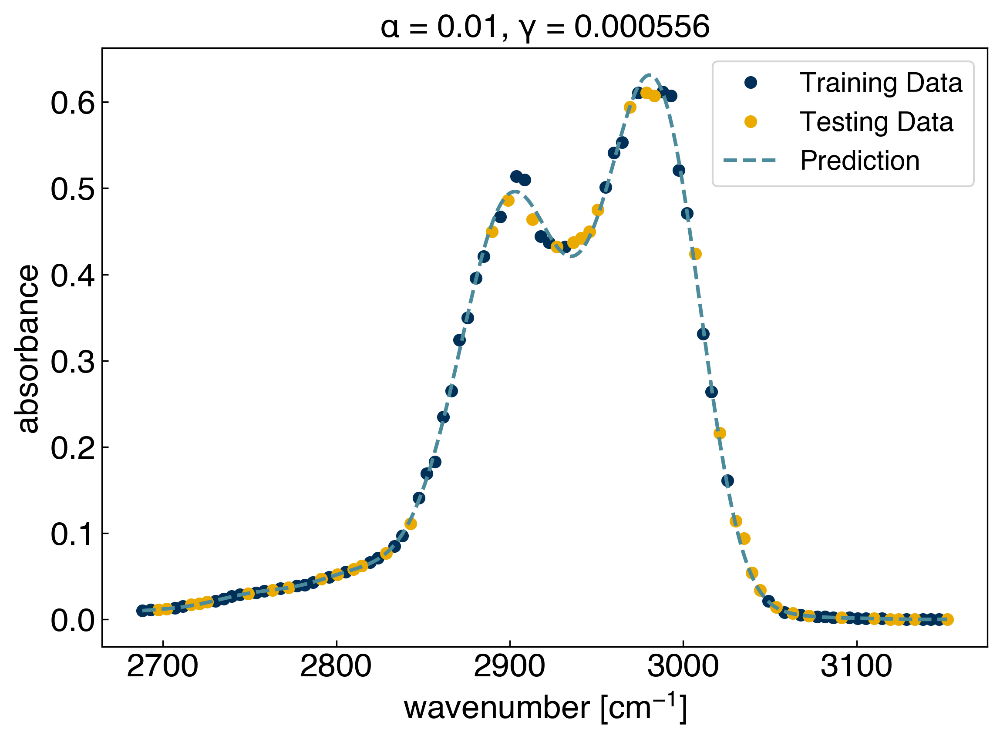

In [17]:
yhat_KRR = KRR_search.best_estimator_.predict(x_predict)

fig, ax = plt.subplots()
ax.plot(x_train, y_train, 'o')
ax.plot(x_test, y_test, 'o')
ax.plot(x_predict, yhat_KRR, '--', markerfacecolor='none')
ax.set_xlabel('wavenumber [$cm^{-1}$]')
ax.set_ylabel('absorbance')
ax.legend(['Training Data', 'Testing Data', 'Prediction'])
ax.set_title(r'$\alpha$ = {}, $\gamma$ = {:.6f}'.format(KRR_search.best_estimator_.alpha, KRR_search.best_estimator_.gamma));

This is much faster than doing all the work yourself!

One note is that the best model will depend on the parameters you search over, as well as the cross-validation strategy. In this case, `cv=3` means that the model performs 3-fold cross-validation at each gridpoint.

### Exercise: Optimize the hyperparameters of a LASSO model for the spectrum data

Search over the same values of $\alpha$ and $\sigma$ as for KRR above, and use 3-fold cross validation.

Note: You will need to use a for loop over the $\sigma$ values. Use `GridSearchCV.best_score_` as accuracy metric.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Visualization-of-features" data-toc-modified-id="Visualization-of-features-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Visualization of features</a></span><ul class="toc-item"><li><span><a href="#Discussion:-Why-might-there-by-bimodal-distributions-in-a-chemical-process?" data-toc-modified-id="Discussion:-Why-might-there-by-bimodal-distributions-in-a-chemical-process?-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Discussion: Why might there by bimodal distributions in a chemical process?</a></span></li></ul></li><li><span><a href="#Scaling-Features-and-Outputs" data-toc-modified-id="Scaling-Features-and-Outputs-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Scaling Features and Outputs</a></span><ul class="toc-item"><li><span><a href="#Discussion:-What-could-go-wrong-with-rescaling-or-mean-scaling?" data-toc-modified-id="Discussion:-What-could-go-wrong-with-rescaling-or-mean-scaling?-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Discussion: What could go wrong with rescaling or mean scaling?</a></span></li></ul></li><li><span><a href="#Multi-Linear-Regression" data-toc-modified-id="Multi-Linear-Regression-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Multi-Linear Regression</a></span><ul class="toc-item"><li><span><a href="#Discussion:-How-many-features-would-result-if-third-order-interactions-were-considered?" data-toc-modified-id="Discussion:-How-many-features-would-result-if-third-order-interactions-were-considered?-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Discussion: How many features would result if third-order interactions were considered?</a></span></li></ul></li><li><span><a href="#Dimensionality-Reduction" data-toc-modified-id="Dimensionality-Reduction-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Dimensionality Reduction</a></span><ul class="toc-item"><li><span><a href="#Forward-Selection" data-toc-modified-id="Forward-Selection-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Forward Selection</a></span></li><li><span><a href="#Exercise:-Use-forward-selection-to-determine-the-minimum-number-of-features-needed-to-get-an-$r^2=0.65$." data-toc-modified-id="Exercise:-Use-forward-selection-to-determine-the-minimum-number-of-features-needed-to-get-an-$r^2=0.65$.-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Exercise: Use forward selection to determine the minimum number of features needed to get an $r^2=0.65$.</a></span></li></ul></li><li><span><a href="#Principal-Component-Regression" data-toc-modified-id="Principal-Component-Regression-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Principal Component Regression</a></span><ul class="toc-item"><li><span><a href="#Discussion:-Why-is-the-model-with-principal-components-not-always-better-than-direct-linear-regression?" data-toc-modified-id="Discussion:-Why-is-the-model-with-principal-components-not-always-better-than-direct-linear-regression?-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Discussion: Why is the model with principal components not always better than direct linear regression?</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

# High-dimensional Data

So far we have only worked with datasets that have a single input dimension. We have generated "features" from this dimension, but we have not considered the case of a problem where multiple inputs are given. This is a very common scenario, and one of the main advantages of many machine-learning methods is that they work well for "high-dimesional" data, or data with many features.

In this lecture we will work with a dataset of chemical process data provided by Dow Chemical. The data comes from a generic chemical process with the following setup:

<img src="images/dow_process.png" width="800">

The dataset contains a number of operating conditions for each of the units in the process, as well as the concentration of impurities in the output stream. Let's take a look:

In [2]:
import pandas as pd
import numpy as np

df = pd.read_excel('data/impurity_dataset-training.xlsx')
df.head(10) #<- shows the first 10 entries

,Date,x1:Primary Column Reflux Flow,x2:Primary Column Tails Flow,x3:Input to Primary Column Bed 3 Flow,x4:Input to Primary Column Bed 2 Flow,x5:Primary Column Feed Flow from Feed Column,x6:Primary Column Make Flow,x7:Primary Column Base Level,x8:Primary Column Reflux Drum Pressure,x9:Primary Column Condenser Reflux Drum Level,...,x36: Feed Column Recycle Flow,x37: Feed Column Tails Flow to Primary Column,x38: Feed Column Calculated DP,x39: Feed Column Steam Flow,x40: Feed Column Tails Flow,Avg_Reactor_Outlet_Impurity,Avg_Delta_Composition Primary Column,y:Impurity,Primary Column Reflux/Feed Ratio,Primary Column Make/Reflux Ratio
0,2015-12-01 00:00:00,327.813,45.7920,2095.06,2156.01,98.5005,95.4674,54.3476,41.0121,52.2353,...,62.8707,45.0085,66.6604,8.68813,99.9614,5.38024,1.49709,1.77833,3.32803,0.291226
1,2015-12-01 01:00:00,322.970,46.1643,2101.00,2182.90,98.0014,94.9673,54.2247,41.0076,52.5378,...,62.8651,45.0085,66.5496,8.70683,99.8637,5.33345,1.51392,1.76964,3.29556,0.294044
2,2015-12-01 02:00:00,319.674,45.9927,2102.96,2151.39,98.8229,96.0785,54.6130,41.0451,52.0159,...,62.8656,45.0085,66.0599,8.69269,100.2490,5.37677,1.50634,1.76095,3.23481,0.300552
3,2015-12-01 03:00:00,327.223,46.0960,2101.37,2172.14,98.7733,96.1223,54.9153,41.0405,52.9477,...,62.8669,45.0085,67.9697,8.70482,100.3200,5.32315,1.47935,1.75226,3.31287,0.293752
4,2015-12-01 04:00:00,331.177,45.8493,2114.06,2157.77,99.3231,94.7521,54.0925,40.9934,53.0507,...,62.8673,45.0085,67.6454,8.70077,100.6590,5.28227,1.44489,1.74357,3.33435,0.286107
5,2015-12-01 05:00:00,328.884,46.0729,2100.26,2134.76,99.3376,95.4188,53.9989,41.0217,53.0389,...,62.8690,45.0085,67.6828,8.69795,100.8260,5.28510,1.51144,1.73488,3.31077,0.290129
6,2015-12-01 06:00:00,327.335,46.0581,2101.57,2191.37,98.9044,94.9811,54.0685,41.0499,52.8279,...,62.8720,45.0085,66.0828,8.70780,100.3580,5.35512,1.51096,1.72619,3.30961,0.290165
7,2015-12-01 07:00:00,329.935,45.9708,2099.27,2133.95,99.6756,94.8352,54.0001,40.9886,52.7697,...,62.8694,45.0085,67.5438,8.69391,101.1360,5.31343,1.51180,1.71750,3.31009,0.287436
8,2015-12-01 08:00:00,329.128,45.8875,2099.12,2055.11,98.8823,95.0573,53.9876,41.0169,52.8802,...,62.8690,45.0085,66.9394,8.70810,100.3630,5.35183,1.48168,1.70881,3.32848,0.288816
9,2015-12-01 09:00:00,327.686,45.8192,2109.75,2185.82,98.8448,95.5414,54.0806,41.0029,53.0875,...,62.8690,45.0085,65.5845,8.69685,100.2790,5.31385,1.51268,1.70012,3.31516,0.291564


In order to work with this data we need to "clean" it to remove missing values. We will come back to this in the "data management" module. For now, just run the cell below and it will create a matrix `X` of inputs and `y` of impurity concentrations:

In [3]:
def is_real_and_finite(x):
    if not np.isreal(x):
        return False
    elif not np.isfinite(x):
        return False
    else:
        return True

all_data = df[df.columns[1:]].values #drop the first column (date)
numeric_map = df[df.columns[1:]].applymap(is_real_and_finite)
real_rows = numeric_map.all(axis=1).copy().values #True if all values in a row are real numbers
X = np.array(all_data[real_rows,:-5], dtype='float') #drop the last 5 cols that are not inputs
y = np.array(all_data[real_rows,-3], dtype='float')
y = y.reshape(-1,1)
print(X.shape, y.shape)

(10297, 40) (10297, 1)


This is the dataset we will work with. We have 10297 data points, with 40 input variables (features) and one output variable. We can pull the names of the features (and output) in case we forget later:

In [4]:
x_names = [str(x) for x in df.columns[1:41]]
y_name = str(df.columns[-3])
print(y_name)
x_names

y:Impurity


['x1:Primary Column Reflux Flow',
 'x2:Primary Column Tails Flow',
 'x3:Input to Primary Column Bed 3 Flow',
 'x4:Input to Primary Column Bed 2 Flow',
 'x5:Primary Column Feed Flow from Feed Column',
 'x6:Primary Column Make Flow',
 'x7:Primary Column Base Level',
 'x8:Primary Column Reflux Drum Pressure',
 'x9:Primary Column Condenser Reflux Drum Level',
 'x10:Primary Column Bed1 DP',
 'x11:Primary Column Bed2 DP',
 'x12:Primary Column Bed3 DP',
 'x13:Primary Column Bed4 DP',
 'x14:Primary Column Base Pressure',
 'x15:Primary Column Head Pressure',
 'x16:Primary Column Tails Temperature',
 'x17:Primary Column Tails Temperature 1',
 'x18:Primary Column Bed 4 Temperature',
 'x19:Primary Column Bed 3 Temperature',
 'x20:Primary Column Bed 2 Temperature',
 'x21:Primary Column Bed 1 Temperature',
 'x22: Secondary Column Base Concentration',
 'x23: Flow from Input to Secondary Column',
 'x24: Secondary Column Tails Flow',
 'x25: Secondary Column Tray DP',
 'x26: Secondary Column Head Pressu

Don't worry if all this code doesn't make sense, we will revisit `pandas` in more detail later. The goal is to predict the output, impurity, as a function of all the input variables.

## Visualization of features

Unlike working with a single variable where we can plot "x vs. y", but it is difficult to get a feel for higher-dimension data since it is hard to visualize. One good thing to start with is looking at histograms of each input variable:

In [5]:
print('X dimensions: {}'.format(X.shape))
print('Feature names: {}'.format(x_names))
N = X.shape[-1]
n = int(np.sqrt(N))
fig, axes = plt.subplots(n, n+1, figsize = (6*n, 6*n))
ax_list = axes.ravel()
for i in range(N):
    ax_list[i].hist(X[:,i])
    ax_list[i].set_xlabel(x_names[i])

X dimensions: (10297, 40)
Feature names: ['x1:Primary Column Reflux Flow', 'x2:Primary Column Tails Flow', 'x3:Input to Primary Column Bed 3 Flow', 'x4:Input to Primary Column Bed 2 Flow', 'x5:Primary Column Feed Flow from Feed Column', 'x6:Primary Column Make Flow', 'x7:Primary Column Base Level', 'x8:Primary Column Reflux Drum Pressure', 'x9:Primary Column Condenser Reflux Drum Level', 'x10:Primary Column Bed1 DP', 'x11:Primary Column Bed2 DP', 'x12:Primary Column Bed3 DP', 'x13:Primary Column Bed4 DP', 'x14:Primary Column Base Pressure', 'x15:Primary Column Head Pressure', 'x16:Primary Column Tails Temperature', 'x17:Primary Column Tails Temperature 1', 'x18:Primary Column Bed 4 Temperature', 'x19:Primary Column Bed 3 Temperature', 'x20:Primary Column Bed 2 Temperature', 'x21:Primary Column Bed 1 Temperature', 'x22: Secondary Column Base Concentration', 'x23: Flow from Input to Secondary Column', 'x24: Secondary Column Tails Flow', 'x25: Secondary Column Tray DP', 'x26: Secondary Co

We can see that some features are normally distributed, while others have some obvious outliers or bimodal distribution.

### Discussion: Why might there by bimodal distributions in a chemical process?

We can also look for feature "correlations" through the covariance matrix. The covariance explains how features vary with each other. We won't go through the math here, but we will discuss the concepts:

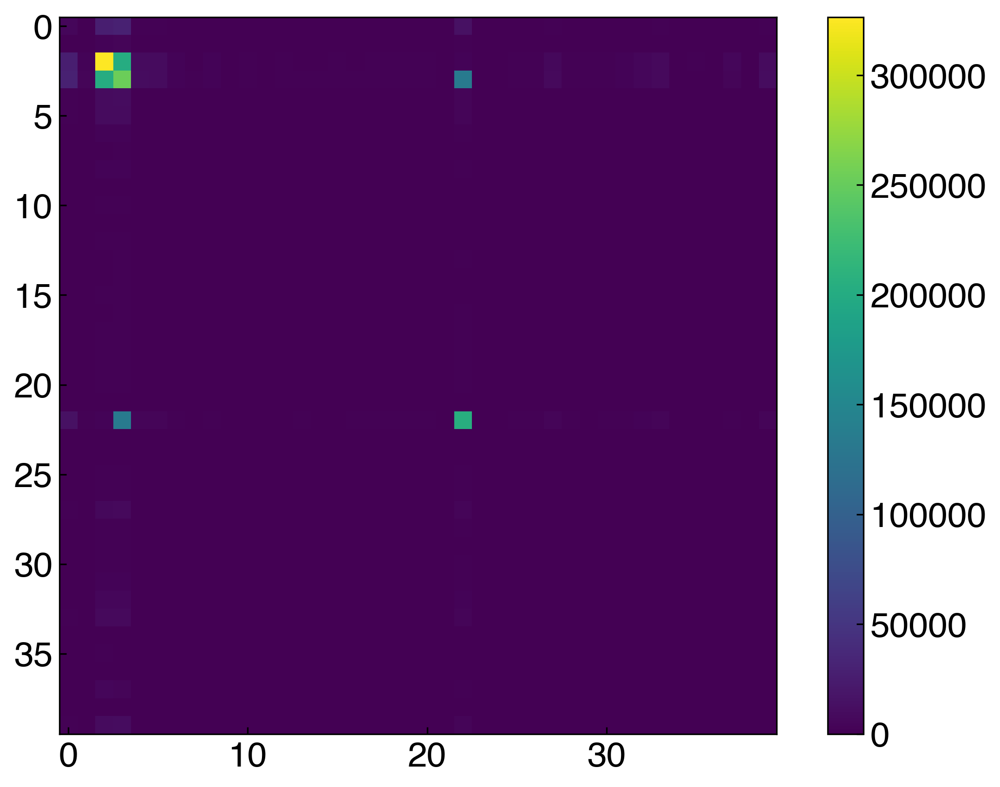

In [6]:
covar = np.cov(X.T)
fig,ax = plt.subplots()
c = ax.imshow(covar)
fig.colorbar(c);

This matrix tells us that some features seem highly correlated. We can look at some specific entries:

In [7]:
covar[2,2]
#covar[2,3]
#covar[1,3]
covar[1,1]

69.6216027860548

These numbers don't seem to mean much right now. The "covariance" between feature 2 and itself is higher than the covariance between feature 1 and itself. We will return to this later.

## Scaling Features and Outputs

We can see that different features have very different ranges, and different units (e.g. degrees, percent, count).  Scaling data is like "non-dimensionalizing" or normalizing for different units. This is often critical to ensure that certain variables are not weighted more than others.

Statistical methods don't know about physical units, so we can normalize or "scale" features to aid in comparison:

* rescaling: 0 = min, 1 = max
* mean scaling: 0 = mean, 1 = max, -1 = min
* **standard scaling: 0 = mean, 1 = standard deviation**
* unit vector: the length of each multi-dimensional vector is 1

See the [scikit-learn documentation](http://scikit-learn.org/stable/modules/preprocessing.html) for more examples and discussion.

Note that scaling is not always a good idea. Sometimes the data have units that are already consistent, or re-scaling can remove some important aspects. Figuring out the best scaling scheme is often achieved through trial and error.

In this case, we can look at the features and see they clearly have different units, and different ranges. For example, feature 1 (Primary column tails flow) ranges from 0 to 50, and feature 2 (Input to primary column Bed 3 Flow) ranges from 0 to ~3000. While we don't necessarily know the units (since this is proprietary data), we can see that there is a difference of range. This is why the covariance matrix didn't make much sense. We can rescale the data to put everything on similar scales.

### Discussion: What could go wrong with rescaling or mean scaling?

> Cannot handle outliers.

In [8]:
X_scaled = (X - X.mean(axis=0))/X.std(axis=0)
print("Minimum: {}, Maximum: {}".format(X.min(), X.max()))
print("Minimum scaled: {}, Maximum scaled: {}".format(X_scaled.min(), X_scaled.max()))

Minimum: -6.91425, Maximum: 5176.74
Minimum scaled: -8.12009681442378, Maximum scaled: 38.10583689480496


Now, we can re-compute the covariance matrix with the rescaled data:

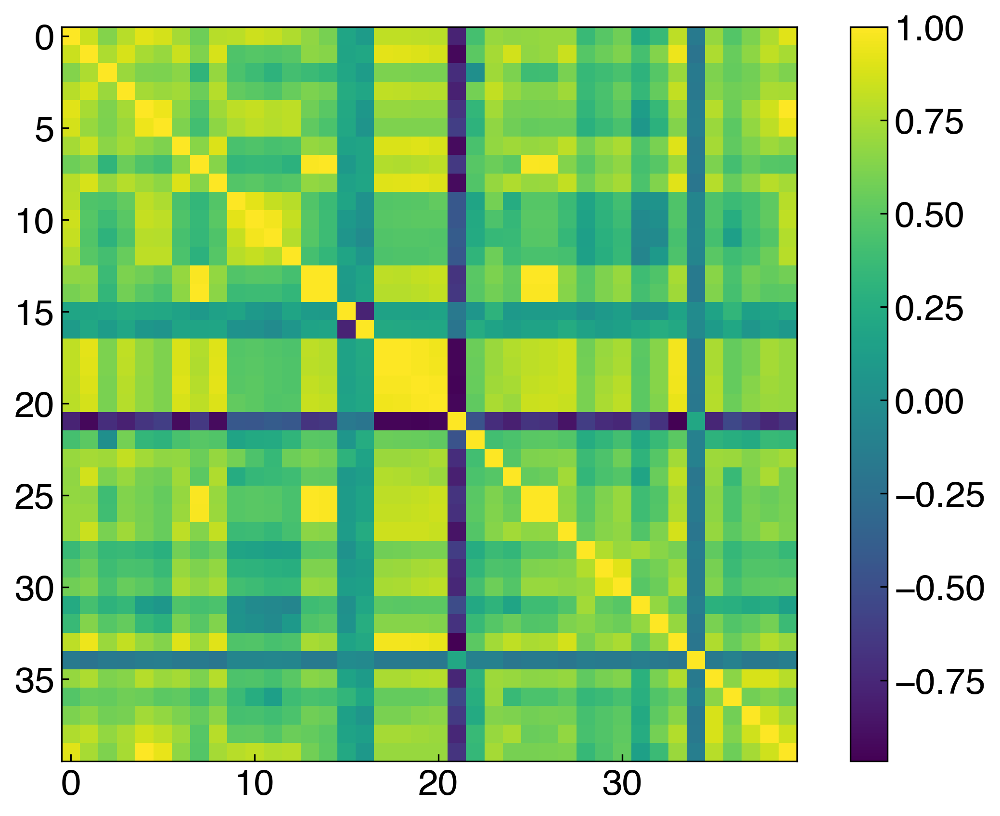

In [9]:
covar = np.cov(X_scaled.T)
fig,ax = plt.subplots()
c = ax.imshow(covar)
fig.colorbar(c);

The structure looks totally different! This is the "correlation matrix", which tells us how correlated different features are on a scale of -1 to 1. A correlation of -1 means they are perfectly anti-correlated, while 1 means they are perfectly correlated. If any features are perfectly correlated then they are linearly dependent (and won't count toward the rank).

In [10]:
covar.max()

1.00009712509717

In [11]:
np.linalg.matrix_rank(X)

40

We see that the rank is 40, but the maximum covariance is 1. The reason is that the diagonal entries of the covariance matrix will always be 1 since features are perfectly correlated with themselves.

If the data has been "standard scaled" then the covariance matrix will range from -1 to 1, and is equivalent to a correlation matrix, which can also be computed directly from the data:

In [12]:
corr = np.corrcoef(X.T)
covar = np.cov(X_scaled.T)
np.isclose(corr, covar, 1e-4).all()

True

We will discuss the covariance/correlation matrix much more later, but when dealing with multi-dimensional data it is always good to check.

## Multi-Linear Regression

We can recall the general form of a linear regression model:

$y_i = \sum_j w_j X_{ij} + \epsilon_i$

Previously, we created features (columns of $X$) by transforming the original 1-dimensional input. In this case, we already have columns of $X$ provided from the data. We can use the same linear regression techniques from before:

In [13]:
from sklearn.linear_model import LinearRegression

model = LinearRegression() #create a linear regression model instance
model.fit(X_scaled, y) #fit the model
r2 = model.score(X_scaled, y) #get the "score", which is equivalent to r^2

yhat = model.predict(X_scaled) #create the model prediction

print("r^2 = {}".format(r2))

r^2 = 0.7168241690081087


We see that the $r^2$ score is 0.71, which is not terrible, but not great either.  We can't really visualize the model since we have 40-dimensional inputs. However, we can make a "parity plot":

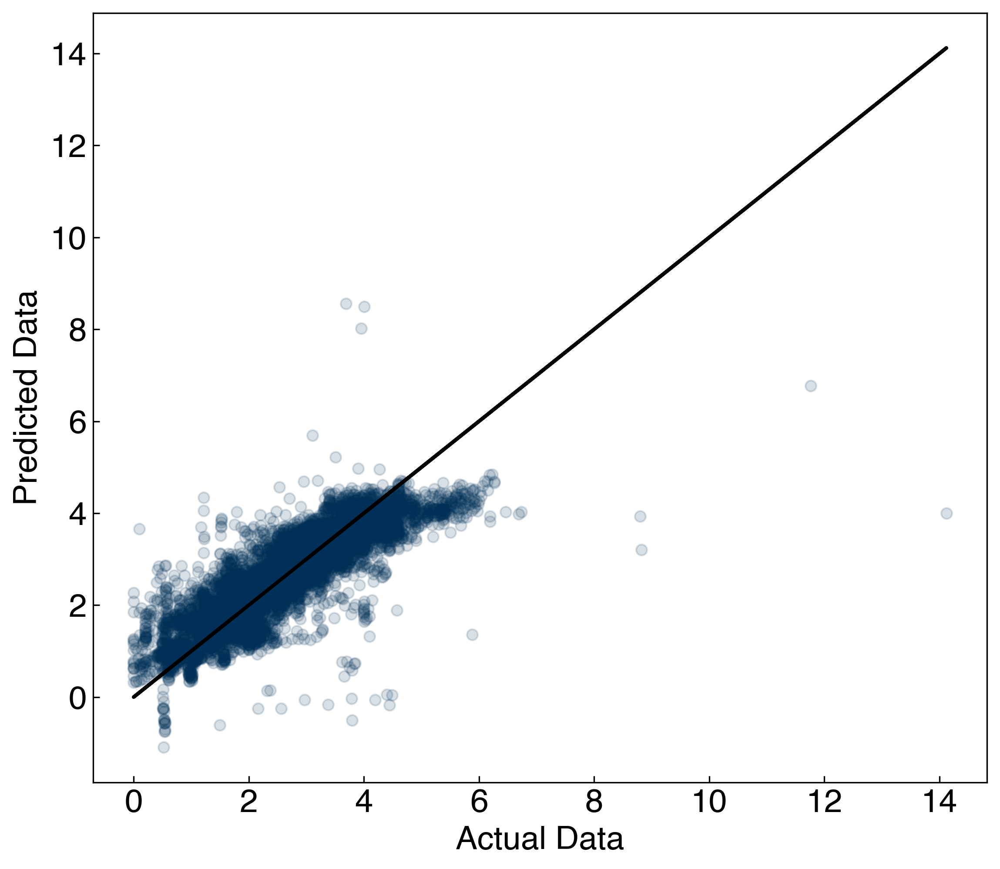

In [14]:
fig, ax = plt.subplots(figsize = (8, 7))

ax.scatter(y, yhat,alpha=0.15)
ax.plot(y,y, '-k')
ax.set_xlabel('Actual Data')
ax.set_ylabel('Predicted Data');

This looks reasonable, although there are quite a few outliers. We should also remember that we trained on all the data, so this might be over-fit. We can quickly test using hold out cross validation: 

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3)

model = LinearRegression() #create a linear regression model instance
model.fit(X_train, y_train) #fit the model to training data
r2_train = model.score(X_train, y_train) #get the score for training data

yhat = model.predict(X_test) #create the model prediction
r2_test = model.score(X_test, y_test) #get the score for testing data

print("r^2 train = {}".format(r2_train))
print("r^2 test = {}".format(r2_test))

r^2 train = 0.7121412699693521
r^2 test = 0.7204661189558348


We see that they are comparable, which indicates that we have not over-fit. We can also visualize both training and testing errors with a parity plot:

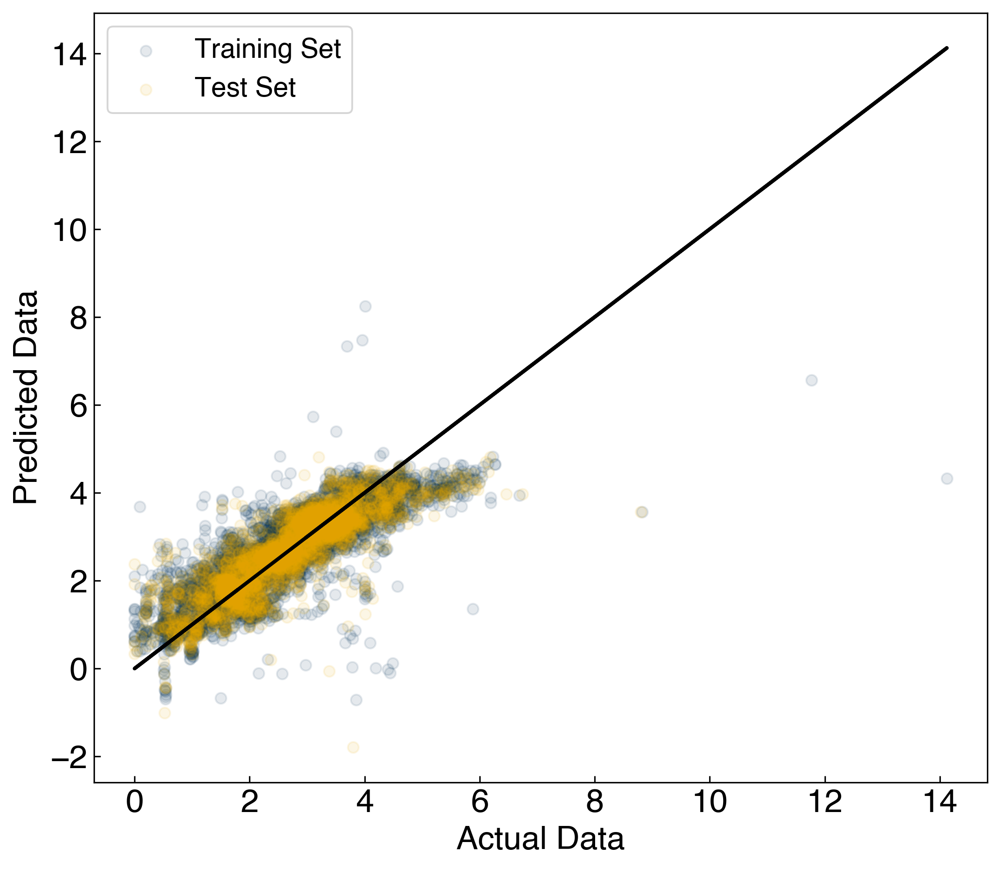

In [16]:
fig, ax = plt.subplots(figsize = (8, 7))

yhat_train = model.predict(X_train)
ax.scatter(y_train, yhat_train,alpha=0.1, label = 'Training Set')
ax.scatter(y_test, yhat,alpha=0.1, label = 'Test Set')

ax.plot(y, y, '-k')
ax.set_xlabel('Actual Data')
ax.set_ylabel('Predicted Data')
ax.legend();

We can see that these look comparable, which confirms that we have not over-fit the model. It is always a good idea to check the parity plot to see if any patterns stand out!

This basic linear regression model is simple, but by testing it we now have a **baseline model**. This tells us that if we have any results worse than this we have a really bad model! 

We see that the performance of the model is not great, and to improve things we will need to add some non-linearity. In 1-dimensional space we achieved this by adding transforms of the features as new features. However, for this is more challenging in a high-dimensional space since the number of features will scale with the number of dimension.

### Discussion: How many features would result if third-order interactions were considered?

> We need $40^3$ features.

Kernel-based methods are very commonly used for high-dimensional spaces because they account for non-linear interactions, but the number of features does not exceed the number of data points. In your homework you will explore the application of KRR to this dataset.

## Dimensionality Reduction

An alternative approach to creating high-dimensional models is to reduce the dimensionality. We will briefly look at some techniques here, and revisit this idea later in the course.

### Forward Selection

The simplest strategy to select or rank features is to try them one-by-one, and keep the best feature at each iteration:

In [17]:
N_features = 40
X_subset = X_scaled.copy()
x_names_subset = np.copy(x_names)
new_X = []
new_X_names = []

while len(new_X) < N_features:
    r2_list = []
    for j in range(X_subset.shape[1]):
        model = LinearRegression() #create a linear regression model instance
        xj = X_subset[:,j].reshape(-1,1)
        model.fit(xj, y) #fit the model
        r2 = model.score(xj, y) #get the "score", which is equivalent to r^2
        r2_list.append([r2, j])
    r2_list.sort() #sort lowest to highest
    r2_max, j_max = r2_list[-1] #select highest r2 value
    new_X.append(X_subset[:,j_max].copy())
    new_X_names.append(x_names_subset[j_max])
    x_names_subset = np.delete(x_names_subset, j_max)
    X_subset = np.delete(X_subset, j_max, axis=1)
    
print('The {} most linearly correlated features are: {}'.format(N_features, new_X_names))

new_X = np.array(new_X).T

The 40 most linearly correlated features are: ['x10:Primary Column Bed1 DP', 'x5:Primary Column Feed Flow from Feed Column', 'x11:Primary Column Bed2 DP', 'x6:Primary Column Make Flow', 'x13:Primary Column Bed4 DP', 'x40: Feed Column Tails Flow', 'x24: Secondary Column Tails Flow', 'x1:Primary Column Reflux Flow', 'x12:Primary Column Bed3 DP', 'x4:Input to Primary Column Bed 2 Flow', 'x37: Feed Column Tails Flow to Primary Column', 'x21:Primary Column Bed 1 Temperature', 'x3:Input to Primary Column Bed 3 Flow', 'x26: Secondary Column Head Pressure', 'x20:Primary Column Bed 2 Temperature', 'x31: Secondary Column Bed 2 Temperature', 'x27: Secondary Column Base Pressure', 'x14:Primary Column Base Pressure', 'x7:Primary Column Base Level', 'x19:Primary Column Bed 3 Temperature', 'x9:Primary Column Condenser Reflux Drum Level', 'x39: Feed Column Steam Flow', 'x18:Primary Column Bed 4 Temperature', 'x36: Feed Column Recycle Flow', 'x2:Primary Column Tails Flow', 'x34: Secondary Column Tails 

We can see how the $r^2$ score changes with the reduced features:

In [18]:
model = LinearRegression() #create a linear regression model instance
model.fit(new_X, y) #fit the model
r2 = model.score(new_X, y) #get the "score", which is equivalent to r^2
print("r^2 = {}".format(r2))

r^2 = 0.7168241690081087


We see that with just 4 features the model performance is substantially reduced. We can keep increasing the number until it is comparable to the full model.

### Exercise: Use forward selection to determine the minimum number of features needed to get an $r^2$=0.60.

![image](./images/forwardSelection.png)

Be careful, since just because features are *linearly* correlated does not mean that they are *non-linearly* correlated. There is also no guarantee that we are not finding correlated features, since if one feature has a high correlation with the output, and is also correlated with another feature, then that feature will also be correlated with the output. One way to avoid this is to ensure that features are orthogonal using the eigenvectors of the covariance matrix.

In [19]:
from scipy.linalg import eigvals, eig

eigvals, eigvecs = eig(corr)

print(eigvals)
print(np.dot(eigvecs[:,1], eigvecs[:,1]))

[2.34052441e+01+0.j 4.18467850e+00+0.j 2.33189497e+00+0.j
 1.76263895e+00+0.j 1.36335613e+00+0.j 1.20647404e+00+0.j
 1.01834809e+00+0.j 9.05685161e-01+0.j 7.82566892e-01+0.j
 6.10463149e-01+0.j 3.47530730e-01+0.j 2.80455458e-01+0.j
 2.36849052e-01+0.j 2.16544576e-01+0.j 1.89968154e-01+0.j
 1.60761700e-01+0.j 1.48884172e-01+0.j 1.13320844e-01+0.j
 1.05664747e-01+0.j 9.52653929e-02+0.j 9.08781901e-02+0.j
 7.52340536e-02+0.j 6.42007155e-02+0.j 6.07057147e-02+0.j
 5.12602559e-02+0.j 3.50465495e-02+0.j 3.13477717e-02+0.j
 2.77621926e-02+0.j 2.56492205e-02+0.j 2.11399627e-02+0.j
 1.51029602e-02+0.j 1.25073823e-02+0.j 1.01495039e-02+0.j
 4.49361769e-03+0.j 3.70219711e-03+0.j 2.62771559e-03+0.j
 1.40665188e-03+0.j 9.42919677e-05+0.j 4.92952293e-05+0.j
 4.69580556e-05+0.j]
1.0


It turns out that by taking the eigenvalues of the covariance matrix you are actually doing something called "principal component analysis". The eigenvectors of the covariance matrix identify the "natural" coordinate system of the data.

<center>
<img src="images/PCA.gif" width="500">
</center>

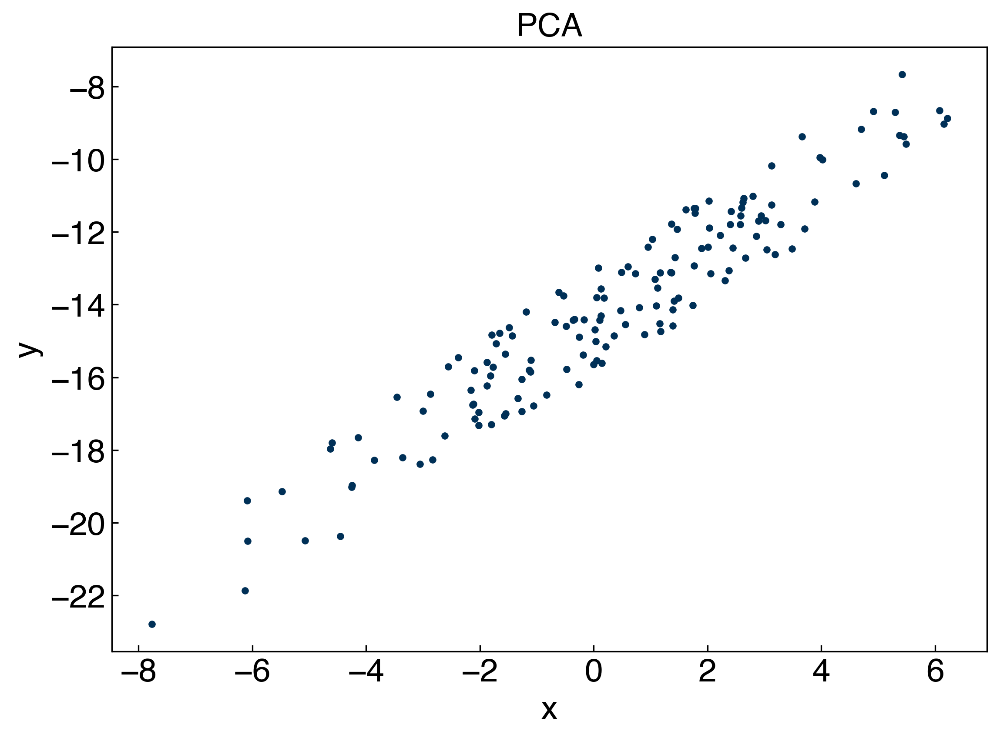

In [20]:
x = np.random.normal(0, 3, 150)
y = x - 15 + 2 - 3 * np.random.random(len(x))
plt.plot(x, y, '.')
plt.xlabel('x')
plt.ylabel('y')
plt.title('PCA');

The eigenvalues provide the variance in each direction, and we can use this to determine how much variance each principal component contributes:

40.00000000000003
[5.85131103e-01 1.04616962e-01 5.82973742e-02 4.40659737e-02
 3.40839033e-02 3.01618510e-02 2.54587022e-02 2.26421290e-02
 1.95641723e-02 1.52615787e-02 8.68826826e-03 7.01138646e-03
 5.92122630e-03 5.41361439e-03 4.74920386e-03 4.01904250e-03
 3.72210430e-03 2.83302111e-03 2.64161866e-03 2.38163482e-03
 2.27195475e-03 1.88085134e-03 1.60501789e-03 1.51764287e-03
 1.28150640e-03 8.76163737e-04 7.83694293e-04 6.94054814e-04
 6.41230512e-04 5.28499069e-04 3.77574006e-04 3.12684559e-04
 2.53737597e-04 1.12340442e-04 9.25549278e-05 6.56928898e-05
 3.51662969e-05 2.35729919e-06 1.23238073e-06 1.17395139e-06]


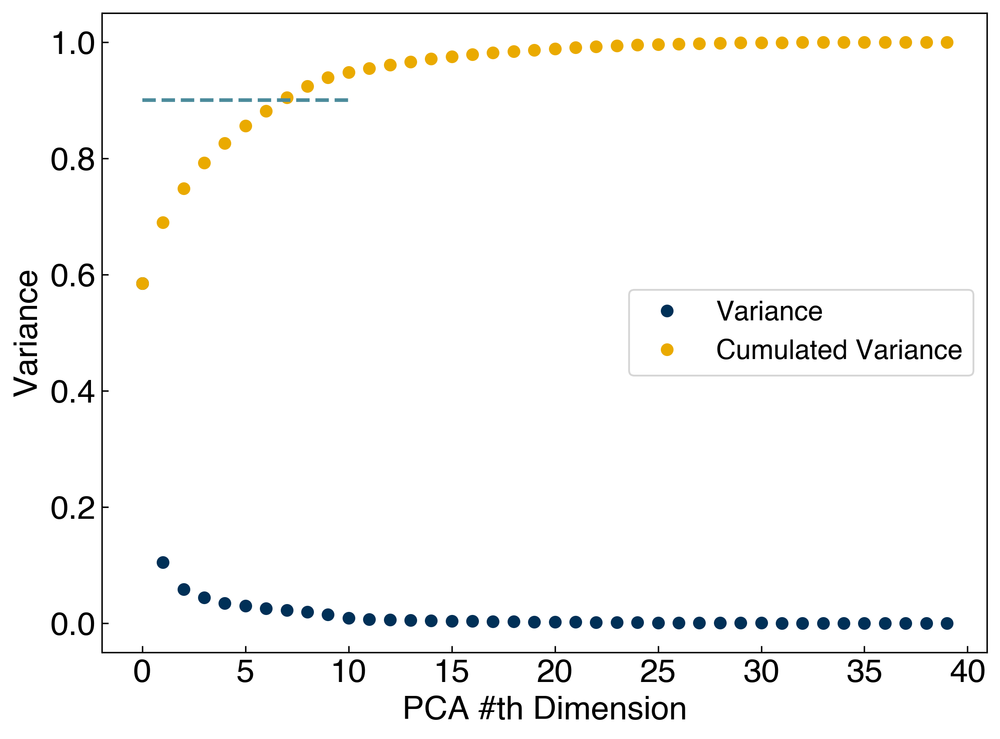

In [21]:
PCvals, PCvecs = eigvals, eigvecs
total_variance = np.sum(np.real(PCvals))
explained_variance = np.real(PCvals)/total_variance
print(total_variance)
print(explained_variance)

fig, ax = plt.subplots()
ax.plot(explained_variance, 'o')
ax.plot(np.cumsum(explained_variance),'o')
ax.plot([0,10],[0.9, 0.9])
ax.set_xlabel('PCA #th Dimension')
ax.set_ylabel('Variance')
ax.legend(['Variance', 'Cumulated Variance']);

We can use this to say that 90% of the variance in the data is explained by the first 7 principal components.

Finally, we can "project" the data onto the principal components. This is equivalent to re-defining the axes of the data.

(10297, 40)


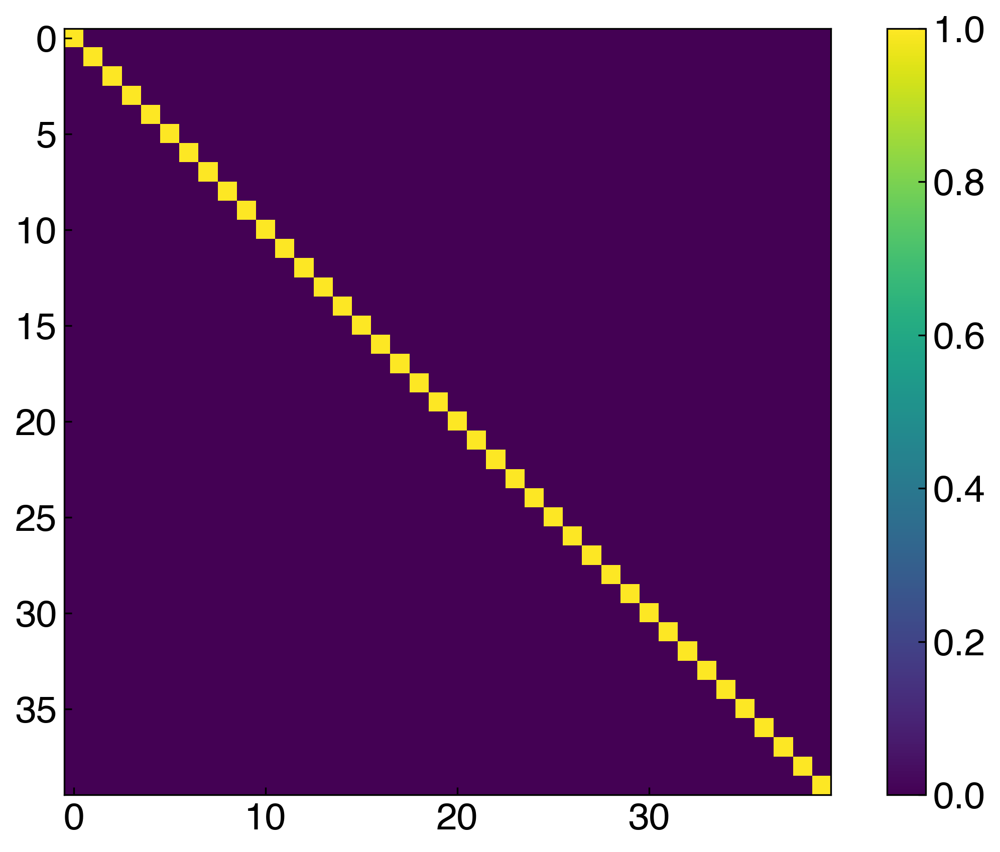

In [22]:
PC_projection = np.dot(X_scaled, PCvecs)
print(PC_projection.shape)

corr_PCs = np.corrcoef(PC_projection.T)
fig,ax = plt.subplots()
c = ax.imshow(corr_PCs)
fig.colorbar(c);

After projection, we still have 40 features but they are now orthogonal - there is no covariance! This means that each one contains unique information.

 We will talk a lot more about PCA throughout the course, but for now you should know:

* Principal component vectors are obtained from the eigenvalues of the covariance matrix
* Principal components are orthogonal
* Principal components explain the variance in multi-dimensional data
* Data can be projected onto principal components

## Principal Component Regression

We can also use the projected data as inputs to a regression model:

In [23]:
y = np.array(all_data[real_rows, -3], dtype = 'float')
y = y.reshape(-1, 1)
model = LinearRegression() #create a linear regression model instance
model.fit(PC_projection, y) #fit the model
r2 = model.score(PC_projection, y) #get the "score", which is equivalent to r^2
print("r^2 = {}".format(r2))

r^2 = 0.7168241690081087


Let's compare this to the original data:

In [24]:
model = LinearRegression() #create a linear regression model instance
model.fit(X_scaled, y) #fit the model
r2 = model.score(X_scaled, y) #get the "score", which is equivalent to r^2
print("r^2 = {}".format(r2))

r^2 = 0.7168241690081087


We see that the answer is the same. This is because we are still ultimately including all the same information. However, if we want to reduce the number of features we will see a difference:

In [25]:
N = 8

model_PC = LinearRegression() #create a linear regression model instance
model_PC.fit(PC_projection[:, :N], y) #fit the model
r2 = model_PC.score(PC_projection[:, :N], y) #get the "score", which is equivalent to r^2
print("r^2 PCA = {}".format(r2))

model = LinearRegression() #create a linear regression model instance
model.fit(X_scaled[:, :N], y) #fit the model
r2 = model.score(X_scaled[:, :N], y) #get the "score", which is equivalent to r^2
print("r^2 regular = {}".format(r2))

r^2 PCA = 0.581112317254554
r^2 regular = 0.4756455003059684


### Discussion: Why is the model with principal components not always better than direct linear regression?

> PCA only takes account of variance of the data. This does not necessarily relate to a linear correlation with the y data.

The PCA projection collects as much information as possible in each feature, and orders them by the amount of variance. We can also check them one-by-one to see how they correlate:

In [26]:
score_list = []
for j in range(PC_projection.shape[1]):
    model = LinearRegression() #create a linear regression model instance
    xj = PC_projection[:,j].reshape(-1, 1)
    model.fit(xj, y) #fit the model
    r2 = model.score(xj, y) #get the "score", which is equivalent to r^2
    score_list.append([r2, j])
score_list.sort()
score_list.reverse()

for r, j in score_list:
    print("{} : r^2 = {}".format(j, r))

1 : r^2 = 0.20685135722275394
0 : r^2 = 0.1740523250716769
6 : r^2 = 0.06122482871680679
7 : r^2 = 0.06048989471356614
4 : r^2 = 0.04417209773857633
25 : r^2 = 0.017497338519021688
8 : r^2 = 0.016205721751366142
5 : r^2 = 0.013951580686418774
2 : r^2 = 0.013223153135118348
16 : r^2 = 0.013047707758553573
33 : r^2 = 0.011755340770010725
18 : r^2 = 0.009381481309652218
9 : r^2 = 0.009144490126667848
15 : r^2 = 0.008497745937736667
3 : r^2 = 0.007147079969638592
21 : r^2 = 0.006899441884438029
31 : r^2 = 0.006459664342175042
22 : r^2 = 0.005113590985049377
14 : r^2 = 0.003515332215412892
11 : r^2 = 0.0033082402426461988
39 : r^2 = 0.0032105781156153146
38 : r^2 = 0.002510692114693458
10 : r^2 = 0.0023541786992695712
27 : r^2 = 0.0022663723214013665
32 : r^2 = 0.002216144465406411
13 : r^2 = 0.0019406439983040702
37 : r^2 = 0.0019400593063266802
20 : r^2 = 0.0018165356203503347
28 : r^2 = 0.00147546784014152
12 : r^2 = 0.000987838964638721
36 : r^2 = 0.000725629300603714
34 : r^2 = 0.00069

We see that the second principal component is actually the best, the first is the second best, and the seventh is third. This is because the principal components only use variance of the inputs, which may or may not correlate to the outputs.

It is common to use PCA or other dimensionality techniques prior to regression when working with high-dimensional data. It is often possible to construct models that have better performance with fewer input dimensions.